# **Fundamentals of Data Science - Winter Semester 2023**


#### Stefano D'Arrigo (TA), Edoardo De Matteis (TA), Daniele Trappolini (TA), and Prof. Fabio Galasso
<darrigo@di.uniroma1.it> , <dematteis@di.uniroma1.it>, <daniele.trappolini@uniroma1.it>, <galasso@di.uniroma1.it>

## **#1 Homework: Image Filtering and Object Identification**

This first homework covers the main topics discussed in class.
Initially, you will be dealing with the original **Image Filtering** methods (*Question 1*), then you will have to work with **Edge Detection** algorithms (*Question 2*), and lastly, you are going to operate first-hand on **Object Identification** techniques (*Question 3*).
Additionally, the homework will contain written questions and reports where you will be asked to write down your answer in Markdown language.
At the end of the homework there is an additional **Bonus Question** that can boost your score by **5 points**.

*Note: your task is to fill in the missing code where you see `"YOUR CODE HERE"` and the text part `"WRITE YOU ANSWER HERE"` part corresponding to each subproblem and produce brief reports on the results whenever necessary.*

As part of the homework, provide the answer to questions in this notebook report-like manner. After you have implemented all the missing code in the required sections, you will be able to run all the code without any errors. We kindly ask you to double-check this since **all** the delivered homework will be executed.

The completed exercise should be handed in as a single notebook file. Use Markdown to provide equations. Use the code sections to provide your scripts and the corresponding plots.

-------------------------------------

**Submit it** by sending an email to:

 **<darrigo@di.uniroma1.it>** , **<dematteis@di.uniroma1.it>**, **<daniele.trappolini@uniroma1.it>**, and **<galasso@di.uniroma1.it>** **by Friday, October 27th, 23:59**.

-------------------------------------

**Members of the team:**

- (Matricola: 2049495) Miguel Angel Sanchez Cortes <sanchezcortes.2049495@studenti.uniroma1.it>
- (Matricola: 1912107) Pasquale Luca Tommassino <tommasino.1912107@studenti.uniroma1.it>
- (Matricola: 2130389) Sofia Noemi Crobeddu <sofianoemi.crobeddu@gmail.com>
- (Matricola: 1917002) Gabriele Volzone <volzone.1917002@studenti.uniroma1.it>
- (Matricola: 2125723) Laura Lopez Sanchez <laura.lopez@alum.esci.upf.edu>

-------------------------------------

**Outline and Scores for #1 Homework:**


* **Question 1: Image Filtering** *(9 points)*
  * **Question 1.0: Warm Up** *(1 point)*
  * **Question 1.1: 1D Filters** *(3 points)*
  * **Question 1.2: 2D Filters** *(4 points)*
  * **#1 Report** *(1 point)*

* **Question 2: Multi-Scale Image Representations** *(9 points)*
  * **Question 2.1: Sobel Operator** *(1 point)*
  * **Question 2.2: Gradient Magnitude** *(1 point)*
  * **Question 2.3: Discrete Laplacian Operator** *(2 point)*
  * **Question 2.4: Canny Edge Detector and Template Matching** *(3 points)*
  * **Question 2.5: Gaussian Pyramid and Multi-Scale Template Matching** *(2 points)*

* **Question 3: Object Identification** *(12 points)*
  * **Question 3.1: 3D Joint Color Histogram** *(2 points)*
  * **Question 3.2: Types of Histograms** *(2 points)*
  * **Question 3.3: Histogram Metrics** *(3 points)*
  * **Question 3.4: Image Retrieval** *(3 points)*
  * **#2 Report** *(2 points)*

* **BONUS Question 4: Performance Evaluation** *(5 points)*
  * **Question 4.1: Closest Neighbours** *(2 points)*
  * **Question 4.2: Performance Evaluation** *(2 point)*
  * **Question 4.3: Analysis and Report** *(1 point)*


**TOTAL POINTS ARE 35, BONUS QUESTION INCLUDED**


## **Question 1: Image Filtering *(9 Points)***

*Recommended libraries to use:*

In [1]:
# Set to True the first time you run this file to install the required packages
install_packages = False
if install_packages:
    %pip install pandas pillow numpy scipy matplotlib opencv-python scikit-image scikit-learn


In [2]:
## import packages
import numpy as np
import pandas as pd
from PIL import Image
from scipy.signal import convolve2d as conv2, convolve
import matplotlib.pyplot as plt
import cv2
import math
from scipy import ndimage
from skimage.metrics import structural_similarity as ssim
from skimage.transform import resize
from typing import List, Tuple, Optional, Dict, Union

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    precision_score,
    recall_score,
    f1_score,
)
from sklearn.linear_model import LogisticRegression

plt.rcParams["figure.figsize"] = (20, 8)


In [3]:
def rgb2gray(rgb: np.ndarray) -> np.ndarray:
    """
    Converts RGB images to grayscale.

    Args:
        rgb (np.ndarray): RGB image.

    Returns:
        gray (np.ndarray): Grayscale image.
    """
    r, g, b = rgb[:, :, 0], rgb[:, :, 1], rgb[:, :, 2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
    return gray


def plot_pictures(
    imgs: List[np.ndarray],
    xlabels: List[str],
    nrows: int,
    ncols: int,
    show: bool = True,
    cmap: Union[str, List[str]] = "gray",
    vmin: Optional[float] = None,
    vmax: Optional[float] = None,
    same_scale: bool = False,
) -> List[plt.Axes]:
    """
    Plots images in a grid.

    Args:
        imgs (list[np.ndarray]): List of images.
        xlabels (list[str]): List of xlabels.
        nrows (int): Number of rows.
        ncols (int): Number of columns.
        show (bool): Whether to show the plot.
        cmap (Union[str, List[str]]): Color map.
        vmin (float): Minimum value.
        vmax (float): Maximum value.
        same_scale (bool): Whether to use the same scale for all images.

    Returns:
        axs (list[matplotlib.axes._subplots.AxesSubplot]): List of axes.
    """
    axs, ax = [], None
    cmap = [cmap] * len(imgs) if isinstance(cmap, str) else cmap
    for (i, img), xlabel, cm in zip(enumerate(imgs), xlabels, cmap):
        sharex = ax if same_scale else None
        sharey = ax if same_scale else None
        ax = plt.subplot(nrows, ncols, i + 1, sharex=sharex, sharey=sharey)
        ax.set_xlabel(xlabel)
        plt.sca(ax)
        plt.imshow(img, cmap=cm, vmin=vmin, vmax=vmax)
        axs.append(ax)

    if show:
        plt.show()
    else:
        return axs


#### **Question 1.0: Warm Up *(1/9 points)***

##### **Convolution**

The convolution is defined as $f[m,n]=I \ast g= \sum_{k,l} I[m-k,n-l]g[k,l]$ and is a linear operator, thus the following properties hold:
* *Homogeneity*: $T[aX]=aT[X]$
* *Additivity* : $T[X_1+X_2]=T[X_1]+T[X_2]$
* *Superposition*: $T[aX_1+bX_2]=aT[X_1]+bT[X_2]$

Prove mathematically the additivity of convolution.

##### **Proof:**
-------------------------------------------------------
Let $I_{1}[m,n]$ and $I_{2}[m,n]$ be two images. Their convolutions with a filter $g[m,n]$ are defined as:

\begin{equation}
f_{1}[m,n] = I_{1} \ast g = \sum_{k,l}I_{1}[m-k,n-l]g[k,l]
\tag{1}
\end{equation}

\begin{equation}
f_{2}[m,n] = I_{2} \ast g = \sum_{k,l}I_{2}[m-k,n-l]g[k,l]
\tag{2}
\end{equation}

If we define $f[m,n]$ as the convolution of the sum of $I_{1}[m,n]$ and $I_{2}[m,n]$ with $g[m,n]$ we obtain that this is:

\begin{align}
f[m,n] = (I_{1}+I_{2}) \ast g =& \sum_{k,l}\left(I_{1}[m-k,n-l]+I_{2}[m-k,n-l]\right)g[k,l]\quad \text{(by definition)} \nonumber \\
=& \sum_{k,l}\left(I_{1}[m-k,n-l]g[k,l]+I_{2}[m-k,n-l]g[k,l]\right)\quad \text{(by distributivity of real numbers)} \nonumber\\
=& \sum_{k,l}I_{1}[m-k,n-l]g[k,l]+\sum_{k,l}I_{2}[m-k,n-l]g[k,l] \quad \text{(by associativity of real numbers)} = I_{1}\ast g+I_{2}\ast g = f_{1}[m,n] + f_{2}[m,n] \nonumber
\end{align}

This concludes, by definition of convolution, and by properties of real numbers (since $I_{k}[i,j] \in \mathbb{R}$), that:

\begin{equation}
(I_{1}+I_{2})  \ast g =  I_{1}\ast g+I_{2}\ast g \quad \text{i.e. the convolution operation is additive} \tag{3}
\end{equation}
$$\hspace{20cm}\blacksquare$$



-------------------------------------------------------

**Exercise on convolutions**

Usually, to be consistent with the definition, we use zero padding: this practice consists of adding a border of zero-valued pixels all around the edges of the input image.
In our case, we will have

\begin{equation}
f[m,n] =
\begin{pmatrix}
0 & 0 & 0 & 0 & 0 \\
0 & 8 & 5 & 2 & 0 \\
0 & 7 & 5 & 3 & 0 \\
0 & 9 & 4 & 1 & 0 \\
0 & 0 & 0 & 0 & 0 \\
\end{pmatrix}
*\begin{pmatrix}
-1 & 0 & 1 \\
-1 & 0 & 1 \\
-1 & 0 & 1 \\
\end{pmatrix}
=\begin{pmatrix}
... & ... & ... \\
... & 18 & ... \\
... & ... & ... \\
\end{pmatrix}.
\tag{1}
\end{equation}

Now, given the images $I_1 \in \mathbb{N}^{5 \times 5}$, $I_2 \in \mathbb{N}^{5 \times 5}$, and the kernel $g \in \mathbb{N}^{2 \times 2}$, apply the additivity property for one convolution operation: you should expect that $T[I_1 + I_2]$ and $T[I_1] + T[I_2]$ get the same result.
Displaying explicitly the operations you performed, feel free to choose the coordinates to apply the convolution on as you like them.

\begin{equation}
    I_1 =
    \begin{pmatrix}
        0 & 0 & 0 & 0 & 0 \\
        0 & 6 & 9 & 8 & 0 \\
        0 & 4 & 8 & 0 & 0 \\
        0 & 0 & 0 & 1 & 0 \\
        0 & 0 & 0 & 0 & 0 \\
    \end{pmatrix}, \quad
    I_2 =
    \begin{pmatrix}
        0 & 0 & 0 & 0 & 0 \\
        0 & 6 & 4 & 3 & 0 \\
        0 & 4 & 0 & 5 & 0 \\
        0 & 4 & 8 & 8 & 0 \\
        0 & 0 & 0 & 0 & 0 \\
    \end{pmatrix}, \quad
    g =
    \begin{pmatrix}
        -1 & 1 \\
        -1 & 1 \\
    \end{pmatrix}
    \tag{2}
\end{equation}

##### **Exercise:**
-------------------------------------------------------

Assuming that the origin coordinates of the image start at the upper left corner of the $3\times 3$ matrix without padding, and defining our coordinate axis negative $k$ axis to be leftwards and our negative $l$ axis to be upwards, by definition we can calculate each entry of the the $f_{1}[m,n] = I_{1}\ast g$ operation as:

\begin{align}
f_{1}[m,n] = I_{1} \ast g =& \sum_{0<k<1 \atop 0<l<1} I_{1}[m-k,n-l]g[k,l] \nonumber\\
=& I_{1}[m-0,n-0]g[0,0] + I_{1}[m-0,n-1]g[0,1] + I_{1}[m-1,n-0]g[1,0] + I_{1}[m-1,n-1]g[1,1]
\end{align}

We can use this formula to calculate the first element of the operation as:

\begin{align*}
f_{1}[0,0] =& I_{1}[0,0]g[0,0] + I_{1}[0,-1]g[0,1] + I_{1}[-1,0]g[1,0] + I_{1}[-1,-1]g[1,1]\\
=& 6*(-1) + 0*(-1) + 0*(1) + 0*(1) = -6  \nonumber
\end{align*}

In order to be quick about the operations, we can also use the more "informal" approach, by mirroring the filter and swiping across the image (multiplying and summing the elements of the filter with the elements of the image in each swipe). With this approach we can obtain the other elements of the convolution:

\begin{align}
f_{1}[1,0] =& (-1)*9 +(1)*6 + (-1)*0 + (1)*0 = -3 \nonumber \\
f_{1}[2,0] =& (-1)*8 +(1)*9 + (-1)*0 + (1)*0 = 1 \nonumber \\
f_{1}[0,1] =& (-1)*4 +(1)*0 + (-1)*6 + (1)*0 = -10 \nonumber \\
f_{1}[1,1] =& (-1)*8 +(1)*4 + (-1)*9 + (1)*6 = -7 \nonumber \\
f_{1}[1,2] =& (-1)*0 +(1)*8 + (-1)*8 + (1)*9 = 9 \nonumber \\
f_{1}[2,0] =& (-1)*0 +(1)*0 + (-1)*4 + (1)*0 = -4 \nonumber \\
f_{1}[2,1] =& (-1)*0 +(1)*0 + (-1)*8 + (1)*4 = -4 \nonumber \\
f_{1}[2,2] =& (-1)*1 +(1)*0 + (-1)*0 + (1)*8 = 7 \nonumber \\
\end{align}

Then, we obtain that the result of the $f_{1}[m,n] = I_{1}\ast g$ operation is:

\begin{equation}
I_{1}\ast g = 
\begin{pmatrix}
-6 & -3 & 1 \\
-10 & -7 & 9 \\
-4 & -4 & 7 \\
\end{pmatrix}
\tag{2}
\end{equation}

We can do the same for the $f_{2}[m,n] = I_{2}\ast g$ operation as:

\begin{align}
f_{2}[0,0] =& (-1)*6 +(1)*0 + (-1)*0 + (1)*0 = -6 \nonumber \\
f_{2}[1,0] =& (-1)*4 +(1)*6 + (-1)*0 + (1)*0 = 2 \nonumber \\
f_{2}[2,0] =& (-1)*3 +(1)*4 + (-1)*0 + (1)*0 = 1 \nonumber \\
f_{2}[0,1] =& (-1)*4 +(1)*0 + (-1)*6 + (1)*0 = -10 \nonumber \\
f_{2}[1,1] =& (-1)*0 +(1)*4 + (-1)*4 + (1)*6 = 6 \nonumber \\
f_{2}[1,2] =& (-1)*5 +(1)*0 + (-1)*3 + (1)*4 = -4 \nonumber \\
f_{2}[2,0] =& (-1)*4 +(1)*0 + (-1)*4 + (1)*0 = -8 \nonumber \\
f_{2}[2,1] =& (-1)*8 +(1)*4 + (-1)*0 + (1)*4 = 0 \nonumber \\
f_{2}[2,2] =& (-1)*8 +(1)*8 + (-1)*5 + (1)*0 = -5 \nonumber \\
\end{align}

Then, we obtain that the result of the $f_{2}[m,n] = I_{2}\ast g$ operation is:

\begin{equation}
I_{2}\ast g = 
\begin{pmatrix}
-6 & 2 & 1 \\
-10 & 6 & -4 \\
-8 & 0 & -5 \\
\end{pmatrix}
\tag{3}
\end{equation}

From equations $(2)$ and $(3)$, we can see that the result of $f[m,n] = I_{1}\ast g + I_{2}\ast g$ is:

\begin{equation}
\boxed{ I_{1}\ast g + I_{2}\ast g = 
\begin{pmatrix}
-12 & -1 & 2 \\
-20 & -1 & 5 \\
-12 & -4 & 2 \\
\end{pmatrix}}
\tag{4}
\end{equation}

Finally, we can calculate the result of the $f[m,n] = (I_{1}+ I_{2})\ast g$ operation. Knowing that the sum of the two images (padded with zeros) is:
\begin{equation}
I_{1} + I_{2} = 
\begin{pmatrix}
0 &0 & 0 & 0 & 0\\
0 &12 & 13 & 11 & 0\\
0 &8 & 8 & 5 & 0\\
0 &4 & 8 & 9 & 0\\
0 &0 & 0 & 0 & 0\\
\end{pmatrix}
\tag{5}
\end{equation}

Then, we obtain that result of the $f[m,n] = (I_{1}+ I_{2})\ast g$ operation as: 

\begin{align}
f[0,0] =& (-1)*12 +(1)*0 + (-1)*0 + (1)*0 = -12 \nonumber \\
f[1,0] =& (-1)*13 +(1)*12 + (-1)*0 + (1)*0 = -1 \nonumber \\
f[2,0] =& (-1)*11 +(1)*13 + (-1)*0 + (1)*0 = 2 \nonumber \\
f[0,1] =& (-1)*8 +(1)*0 + (-1)*12 + (1)*0 = -20 \nonumber \\
f[1,1] =& (-1)*8 +(1)*8 + (-1)*13 + (1)*12 = -1 \nonumber \\
f[1,2] =& (-1)*5 +(1)*8 + (-1)*11 + (1)*13 = 5 \nonumber \\
f_[2,0] =& (-1)*4 +(1)*0 + (-1)*8 + (1)*0 = -12 \nonumber \\
f[2,1] =& (-1)*8 +(1)*4 + (-1)*8 + (1)*8 = -4 \nonumber \\
f[2,2] =& (-1)*9 +(1)*8 + (-1)*5 + (1)*8 = 2 \nonumber \\
\end{align}

With this, we can see that the result of the $f[m,n] = (I_{1}+ I_{2})\ast g$ operation is:

\begin{equation}
\boxed{(I_{1}+ I_{2})\ast g = 
\begin{pmatrix}
-12 & -1 & 2 \\
-20 & -1 & 5 \\
-12 & -4 & 2 \\
\end{pmatrix}}
\tag{6}
\end{equation}

Thus confirming numerically for this case (although it is true for every case since we proved it) that:
\begin{equation}
(I_{1}+ I_{2})\ast g = I_{1}\ast g + I_{2}\ast g
\tag{7}
\end{equation}


-------------------------------------------------------

#### **Question 1.1: 1D Filters *(3/9 Points)***


##### **1.1.1: 1-D Gaussian Filter**

Implement a method which computes the values of a 1-D Gaussian $G_x$ for a given standard deviation $\sigma$ and filter size $k$.:
\begin{equation}
G(x)=\frac{1}{\sqrt{2\pi}\sigma}\exp\left(-\frac{x^2}{2\sigma^2}\right)
\end{equation}

The method should return a vector $x$ of values on which the Gaussian filter is defined: integer values on the interval $\left[-k\sigma,k\sigma\right]$.

With $\sigma=3$ and $k=3$ you should get the following output:

![](./images/1gauss.png)

In [4]:
def gauss(sigma: int, filter_size: int = 3) -> Tuple[np.ndarray, np.ndarray]:
    """
    Computes the Gaussian filter.

    Args:
        sigma (int): Standard deviation.
        filter_size (int): Filter size, be wary that it is the full size of the filter.

    Returns:
        Gx (np.ndarray): Gaussian filter.
        x (np.ndarray): Array of integer values.
    """
    #Since filter_size is the full size of the filter, then we define k = filter_size
    k = filter_size 
    #x is an array of integer values from -k*sigma to k*sigma
    x =  np.linspace(-k*sigma,k*sigma, int(2*k*sigma+1))
    #Here we apply a Gaussian function to each value of x
    Gx =(1/(sigma*np.sqrt(2*np.pi)))*np.exp(-x**2/(2*sigma**2))
    #Here we return the Gaussian filter and the array of integer values
    return Gx, x


--------------------------------------------

**Do not write below this line just run it**

--------------------------------------------

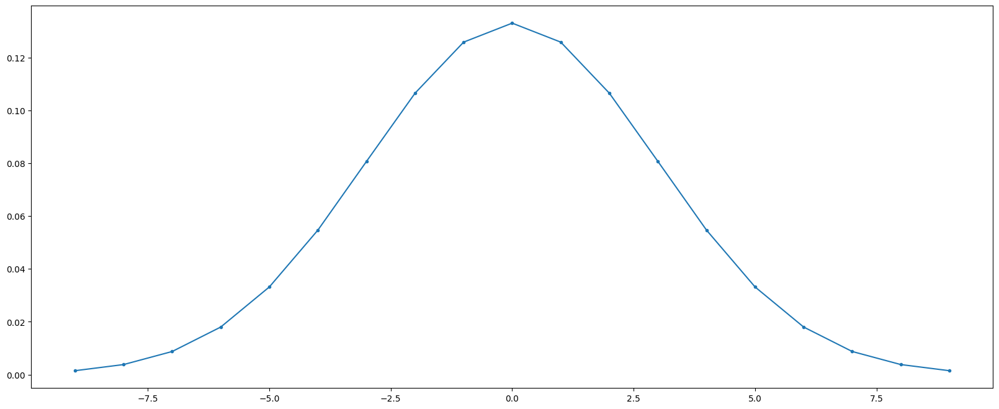

In [5]:
sigma = 3
filter_size = 3
Gx, x = gauss(sigma, filter_size)
plt.figure(1)
plt.plot(x, Gx, ".-")
plt.show()


**Variation of $\sigma$ and filter size**

Now we generate a signal and apply the Gauss filter with different values of $\sigma$ and filter size.
Write down your considerations.

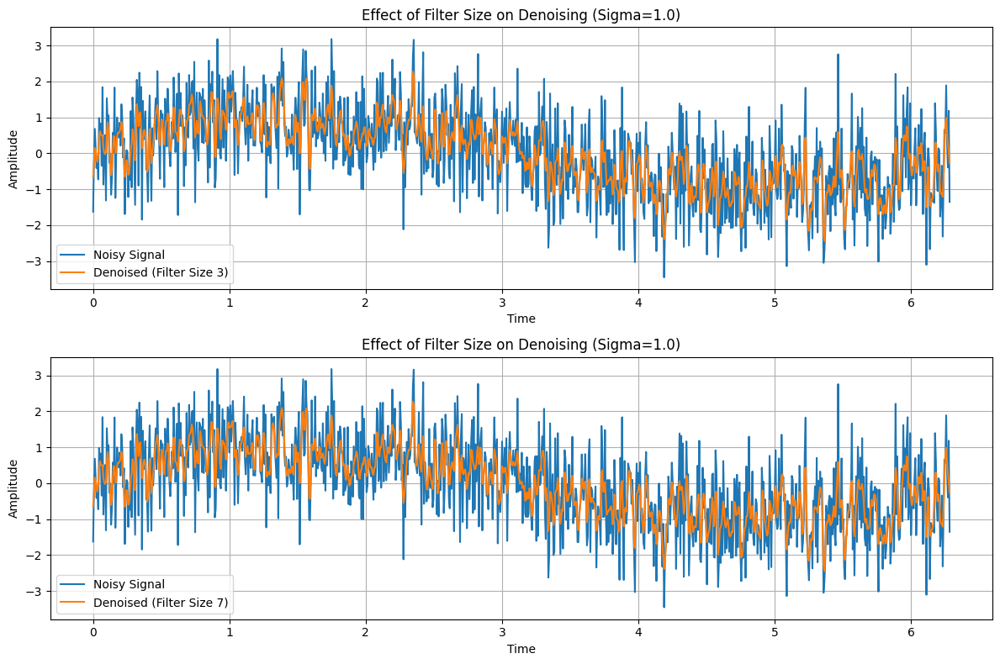

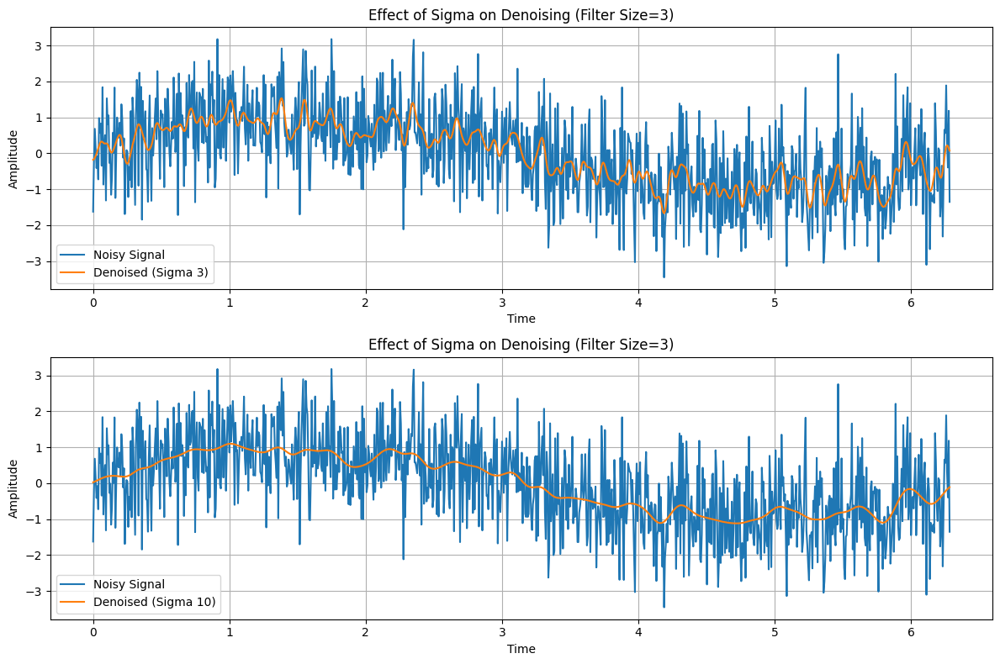

In [6]:
# Generate a noisy signal with increased noise (example data)
t = np.linspace(0, 2 * np.pi, 1000)
noisy_signal = np.sin(t) + 1.0 * np.random.randn(len(t))  # Increased noise

# Define a fixed sigma value
sigma = 1.0

# Define a range of filter sizes to test
filter_sizes = [3, 7]

# Create subplots to compare the denoising results
plt.figure(figsize=(12, 8))

for i in range(len(filter_sizes)):
    # Get the Gaussian kernel and x values from the custom gauss function
    Gx, x = gauss(sigma, filter_sizes[i])

    # Convolve the noisy signal with the Gaussian filter
    denoised_signal = np.convolve(noisy_signal, Gx, mode="same")

    # Plot the noisy and denoised signals for the current filter_size
    plt.subplot(len(filter_sizes), 1, i + 1)
    plt.plot(t, noisy_signal, label="Noisy Signal")
    plt.plot(t, denoised_signal, label=f"Denoised (Filter Size {filter_sizes[i]})")
    plt.title(f"Effect of Filter Size on Denoising (Sigma={sigma})")
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()


# Define a fixed sigma value
sigma = [3, 10]

# Define a range of filter sizes to test
filter_sizes = 3

# Create subplots to compare the denoising results
plt.figure(figsize=(12, 8))

for i in range(len(sigma)):
    # Get the Gaussian kernel and x values from the custom gauss function
    Gx, x = gauss(sigma[i], filter_sizes)
    denoised_signal = np.convolve(noisy_signal, Gx, mode="same")

    # Plot the noisy and denoised signals for the current filter_size
    plt.subplot(len(sigma), 1, i + 1)
    plt.plot(t, noisy_signal, label="Noisy Signal")
    plt.plot(t, denoised_signal, label=f"Denoised (Sigma {sigma[i]})")
    plt.title(f"Effect of Sigma on Denoising (Filter Size={filter_sizes})")
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()


##### **Report:**

-------------------------------------------------------

The 1D Gaussian Filter is defined by an 1D Gaussian function with mean $\mu=0$ (centered in 0):
\begin{equation}
G(x)=\frac{1}{\sqrt{2\pi}\sigma}\exp\left(-\frac{x^2}{2\sigma^2}\right),
\end{equation}

where $x\in [-k\sigma, k\sigma]$, where $k$ is the filter size.

As we've seen in class and other courses, the standard deviation $\sigma$ plays a very important role in the behaviour of this filter, specially when filtering a signal (or an image), since what this filter does is a **weighted average** of surrounding pixels based on the Gaussian distribution, called also a Gaussian smoothing. 

If we plot a Gaussian distribution with fixed $k$ and varying $\sigma$, we can observe that the higher the value of $\sigma$, the higher the spread of the function and therefore, the greater the smoothing the Gaussian filter will do on a given signal:

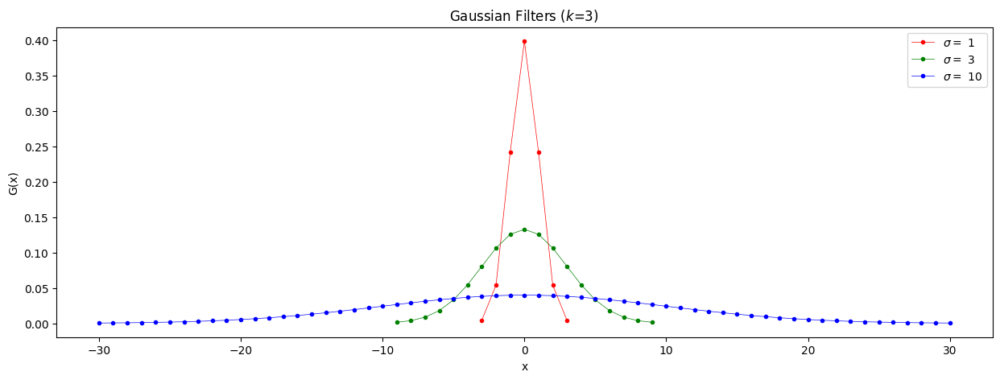

In [7]:
#Here we define a list of sigmas to test
sigmas = [1, 3, 10]
#Here we define a list of colors to use in the plot
colors = ["r", "g", "b"]
#Here we define the filter size
filter_size = 3

#Here we plot the Gaussian filters for each sigma
plt.figure(figsize=(15, 5))
#Here we iterate over each sigma
for sigma in sigmas:
    #Here we get the Gaussian filter and the array of integer values from the gauss function
    Gx, x = gauss(sigma, filter_size)
    #Here we plot the Gaussian filter
    plt.plot(x, Gx, ".-", label=f"$\sigma=$ {sigma}", linewidth=0.5, color = colors[sigmas.index(sigma)])

plt.title(f"Gaussian Filters ($k$={filter_size})")
plt.xlabel("x")
plt.ylabel("G(x)")
plt.legend()



From this plot we can see that (for a fixed $k$) for small values of $\sigma$ the values of the Gaussian filter remain quite high and localized on a small portion of the signal/image, therefore resulting in a low smoothing effect. On the contrary, for high values of $\sigma$ the values of the Gaussian filter decrease to almost zero but reaching big portions of the signal, resulting in a very high smoothing effect. In conclusion, the $\sigma$ controls the strength of the smoothing effect the filter applies to a signal/image. In this case, looking at the last two plots of the signal (in blue) after applying a Gaussian filter with $\sigma=3$ and $\sigma=10$, we can see that for a fixed $k$, when $\sigma$ increases, the Gaussian filter applies a higher smoothing to the signal resulting on an almost homogeneous signal (in orange).

In the case of the first two plots, when $\sigma$ remains fixed and $k$ varies from $k=3$ and $k=7$ it is important to notice that the value of $k$ doesn't play a role on the smoothing of a signal, since this only defines the range where this filter is defined. We can see this making another plot:

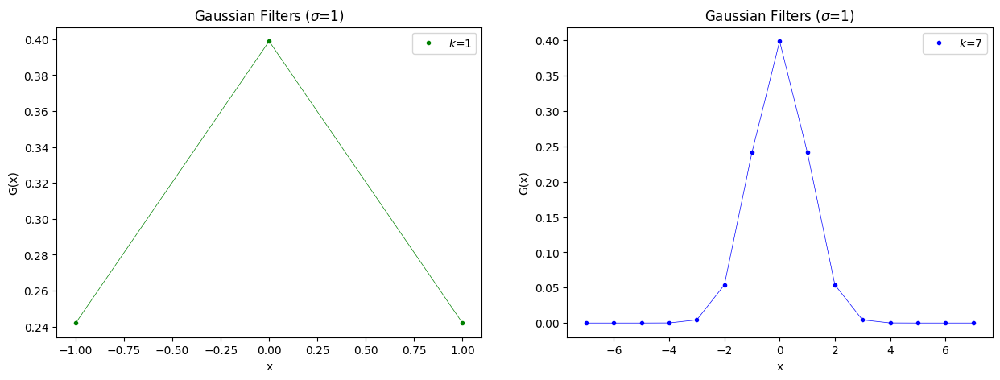

In [8]:
#Here we define a list of k to test
kappas = [1, 7]
#Here we define a list of colors
colors = ["g", "b"]
#Here we define the filter size
sigma = 1

#Here we plot the Gaussian filters for each sigma
plt.figure(figsize=(15, 5))
#Here we iterate over each sigma
for k in kappas:
    #Here we create a subplot for each k
    plt.subplot(1, 2, kappas.index(k)+1)
    #Here we get the Gaussian filter and the array of integer values from the gauss function
    Gx, x = gauss(sigma, k)
    #Here we plot the Gaussian filter
    plt.plot(x, Gx, ".-", label=f"$k$={k}", linewidth=0.5, color = colors[kappas.index(k)])
    plt.legend()
    plt.xlabel("x")
    plt.ylabel("G(x)")
    plt.title(f"Gaussian Filters ($\sigma$={sigma})")


With these plots we can see that as $k$ grows, the values of the kernel outside the range defined by $\sigma$ decrease drastically to almost zero which means that the smoothing we'll be done only on the pixels within the range defined by the $\sigma$ and therefore do not depend on the value of $k$. This can be seen more clearly looking at the first two plots of the signal (in blue) after applying a Gaussian filter with $k=1$ and $k=7$, we can see that for a fixed $\sigma$, the smoothing is identical in both cases, which confirms our reasoning.

In **summary**: The first set of plots, vary the filter size $k$ while keeping $\sigma$ fixed, and the second set vary $\sigma$ while keeping the filter size $k$ fixed. From the first 2 plots it can be seen how the filter size $k$ doesn't affect in any way the smoothing performed by a Gaussian filte (for a fixed value of $sigma=1$). In contrast, the same cannot be said for the other 2 graphs. In fact, we can see that as $\sigma$ increases, the image is more smoothed and also the noise is notoriously reduced making the signal 'cleaner' with respect to the noisy signal.

-------------------------------------------------------

##### **1-D Box Filter**

Implement a method that computes the values of a 1-D Box $B_x$ for a given standard deviation $\sigma$:
\begin{equation}
B= \left[\frac{1}{n},\frac{1}{n},\dots,\frac{1}{n}\right] \in \mathbb{R}^n
\end{equation}

The method should also return a vector $x$ of values on which the filter is defined: integer values in the interval $\left[-3\sigma,3\sigma\right]$.

An example of a Box Filter:

![](./images/1box.png)

In [9]:
def box(filter_size: int = 3) -> Tuple[np.ndarray, np.ndarray]:
    """
    Box filter.

    Args:
        filter_size (int): Filter size.

    Returns:
        Bx (np.ndarray): Box filter.
        x (np.ndarray): x values.
    """
    #Since filter_size is the full size of the filter, for the box filter k is the half size of the filter
    k = filter_size//2
    #x is an array of integer values from -k to k
    x = np.linspace(-k, k, filter_size)
    #Here we define n as the length of x
    n = len(x)
    #To build the box filter, we use the np.full function to create an array of length n values equal to 1/n
    Bx = np.full(n, 1/n)

    #Here we return the box filter and the array of integer values
    return Bx, x


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

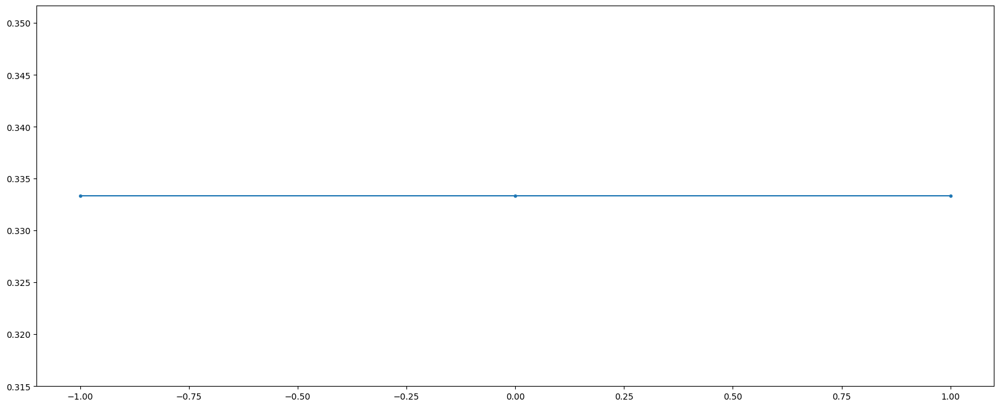

In [10]:
## function box
size = 3
Bx, x = box(size)
plt.figure(1)
plt.plot(x, Bx, ".-")
plt.show()


##### **1.1.2: 1D Laplacian filter**

Derive the 1-D Laplacian $L_x$, then implement a method that computes it for a given standard deviation $\sigma$ and filter size $k$:

With $\sigma=3$ and $k=10$ you shouls expect the following output:

![](./images/1laplace.png)

##### **Derivation of the 1D Laplacian Filter**
-------------------------------------------------------
We can obtain the 1D Laplacian Filter by taking the second derivative of the Gaussian function defined above:

\begin{equation}
G(x)=\frac{1}{\sqrt{2\pi}\sigma}\exp\left(-\frac{x^2}{2\sigma^2}\right) \tag{1}
\end{equation}

The first derivative of this function, using the chain rule is the following:

\begin{align}
\frac{dG(x)}{dx} =& \frac{d}{dx}\left(\frac{1}{\sqrt{2\pi}\sigma}\exp\left(-\frac{x^2}{2\sigma^2}\right) \right)  \quad \text{(by definition)} \nonumber\\
=& \frac{1}{\sqrt{2\pi}\sigma} \frac{d}{dx}\left(\exp\left(-\frac{x^2}{2\sigma^2}\right) \right) \quad \text{(since $\frac{d(cf(x))}{dx} = c\frac{df(x)}{dx}$)}\nonumber\\
=& \frac{1}{\sqrt{2\pi}\sigma}\exp\left(-\frac{x^2}{2\sigma^2}\right) \frac{d}{dx}\left(-\frac{x^2}{2\sigma^2} \right) \quad \text{(since $\frac{d(e^{u(x)})}{dx} = e^u(x)\frac{du(x)}{dx}$)}\nonumber\\
=& -\frac{1}{2\sigma^2} \cdot \frac{1}{\sqrt{2\pi}\sigma}\exp\left(-\frac{x^2}{2\sigma^2}\right) \frac{d}{dx}\left(x^2\right) \quad \text{(since $\frac{d(cf(x))}{dx} = c\frac{df(x)}{dx}$)}\nonumber\\
=& -\frac{2}{2\sigma^2} \cdot \frac{1}{\sqrt{2\pi}\sigma}\exp\left(-\frac{x^2}{2\sigma^2}\right) \cdot x \quad \text{(since $\frac{d(x^n)}{dx} = nx^{n-1}$)} = \boxed{-\frac{1}{\sqrt{2\pi}\sigma^3}x\exp\left(-\frac{x^2}{2\sigma^2}\right)} \tag{2}
\end{align}

The second derivative is done in an analogous way:

\begin{align}
L(x) = \frac{d^2 G(x)}{dx^2} =& \frac{d}{dx}\left(-\frac{1}{\sqrt{2\pi}\sigma^3}x\exp\left(-\frac{x^2}{2\sigma^2}\right) \right)  \quad \text{(by (2))} \nonumber\\
=& -\frac{1}{\sqrt{2\pi}\sigma^3}\frac{d}{dx}\left(x\exp\left(-\frac{x^2}{2\sigma^2}\right) \right)  \quad \text{(since $\frac{d(cf(x))}{dx} = c\frac{df(x)}{dx}$)} \nonumber \\
=& -\frac{1}{\sqrt{2\pi}\sigma^3}\left(x\cdot\frac{d}{dx}\left(\exp\left(-\frac{x^2}{2\sigma^2}\right) \right) + \frac{dx}{dx} \cdot \exp\left(-\frac{x^2}{2\sigma^2}\right) \right)  \quad \text{(since $\frac{d(f(x)\cdot g(x))}{dx} = \frac{df(x)}{dx}\cdot g(x) +  \frac{dg(x)}{dx}\cdot f(x)$)} \nonumber \\
=& -\frac{1}{\sqrt{2\pi}\sigma^3}\left(x\left(-\frac{2x}{2\sigma^2}\right)\cdot\exp\left(-\frac{x^2}{2\sigma^2}\right)  + 1 \cdot \exp\left(-\frac{x^2}{2\sigma^2}\right) \right)  \quad \text{(since $\frac{d(e^{u(x)})}{dx} = e^u(x)\frac{du(x)}{dx}$ and $\frac{d(x^n)}{dx} = nx^{n-1}$)} \nonumber \\
=& \frac{1}{\sqrt{2\pi}\sigma^3}\exp\left(-\frac{x^2}{2\sigma^2}\right)\left(\frac{x^2}{\sigma^2}  - 1 \right)   = \boxed{\frac{x^2 - \sigma^2}{\sqrt{2\pi}\sigma^5}\exp\left(-\frac{x^2}{2\sigma^2}\right)} \tag{3}
\end{align}
-------------------------------------------------------

In [11]:
def laplace(sigma: int, filter_size: int) -> Tuple[np.ndarray, np.ndarray]:
    """
    Laplace 1D filter.

    Args:
        sigma (int): Standard deviation.
        filter_size (int): Filter size.

    Returns:
        Lx (np.ndarray): Laplace filter.
        x (np.ndarray): x values.
    """

    #Since filter_size is the full size of the filter, we define k=filter_size
    k = filter_size
    #x is an array of integer values from -k*sigma to k*sigma
    x = np.linspace(-k*sigma,k*sigma,int(2*k*sigma+1))
    #Here we apply the Laplace function to each value of x
    Lx = ((x**2 - sigma**2)/(np.sqrt(2*np.pi)*sigma**5))*np.exp(-x**2/(2*sigma**2))
    #Here we return the Laplace filter and the array of integer values
    return Lx, x


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

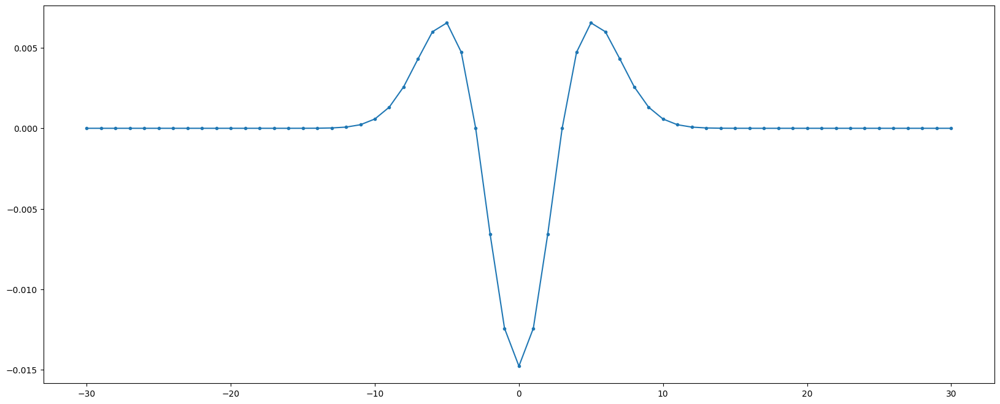

In [12]:
sigma = 3
filter_size =10
Lx, x = laplace(sigma, filter_size)
plt.figure(1)
plt.plot(x, Lx, ".-")
plt.show()


#### **1.1.3: An example of non-linear filter: 1-D median filter**

Up until now we have worked with linear 1-D filters, you are now asked to implement a non-linear one: the 1-D median filter. 
At each position $p$ of a given 1-D signal $\mathcal{S}$, the median filter of size $s$ takes the neighborhood $\mathcal{N}_s(p)=[\mathcal{S}(p - \frac{s - 1}{2}), \mathcal{S}(p + \frac{s - 1}{2})]$, and replaces the value of $p$ with the median of the values in $\mathcal{N}_s(p)$.
Since it removes outliers from $\mathcal{N}_s(p)$, the median filter is often used in image and signal processing to remove noise.

Complete the method below to compute the median filter $m(\cdot)$ of size $s$ for all elements of a signal $\mathcal{S}$.
The method should return the filtered signal.
From the description above, you may have noticed that one must *carefully* consider how to deal with the boundaries of the signal.
In this exercise, you are free to choose the strategy to deal with the boundaries, you may look [here](https://en.wikipedia.org/wiki/Median_filter).

You should get the following input-output pair:

![1dmedian](./images/1dmedian.png)

In [13]:
def median_filter(signal: np.ndarray, filter_size: int) -> np.ndarray:
    """
    Median 1D filter.
    You are free to choose how to deal with the beginning and the end of the signal.
    You can use the `np.median` function https://numpy.org/doc/stable/reference/generated/numpy.median.html

    Args:
        signal (np.ndarray): 1-D array of values
        filter_size (int): size of the filter

    Returns:
        signal (np.ndarray): 1-D array of values with the median values computed at each position
    """
    #Here we loop over the values of the signal
    for p in range(len(signal)):
        #For every value of the signal, we define the left and right boundaries of the neighborhood
        left = int(p - (filter_size-1)//2)
        right = int(p + (filter_size-1)//2)
        
        #In order to deal with the beginning and the end of the signal, we check if the left and right boundaries are within the signal
        if left >= 0 and right < len(signal):
            #If they are, we define the points within the neighborhood
            neighborhood = signal[left: right+1]
            #Then we apply the median function to the neighborhood and append the result to the new_signal list
            median = np.median(neighborhood)
            signal[p] = median
        #If the left and right boundaries of p are not within the signal, we chose to ignore this point
        #This is done because one way to deal with boundary values is: "Avoid processing the boundaries, with or without cropping the signal or image boundary afterwards"
        else:
            pass
    
    #Finally, we return the new_signal list as an array
    return signal


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

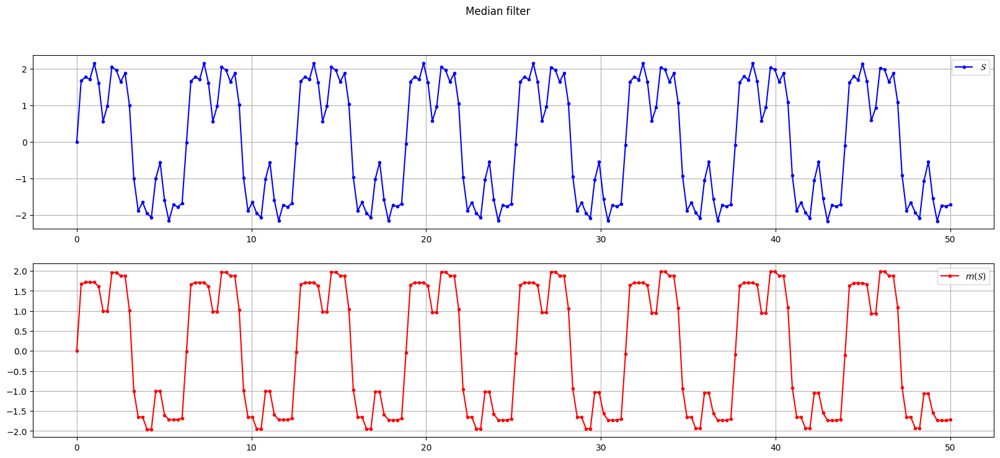

In [14]:
filter_size = 3
signal = lambda x: 2 * np.sin(x) + np.sin(3 * x) + 0.5 * np.sin(7 * x)
x = np.linspace(0, 50, 200)
in_signal = signal(x)
out_signal = median_filter(in_signal.copy(), filter_size)
fig, axs = plt.subplots(2)
fig.suptitle("Median filter")
axs[0].plot(x, in_signal, ".-", label="$\mathcal{S}$", color="blue")
axs[0].grid()
axs[0].legend()
axs[1].plot(x, out_signal, ".-", label="$m(\mathcal{S})$", color="red")
axs[1].grid()
axs[1].legend()
plt.show()


#### **1.1.4: Check linearity of the filters**

In *Question 1.0: warmup* we have seen some of the properties of linear operators and we have proven the additivity property of convolution. 
Consider the 1-D Gaussian filter $g(\cdot)$, the 1-D Laplacian filter $l(\cdot)$, and the 1-D median filter $m(\cdot)$. 
You are given signals $\mathcal{S}_1$ and $\mathcal{S}_2$, by taking advantage of the functions you have implemented in the previous exercises, empirically verify the following:

1. $g(\mathcal{S}_1 + \mathcal{S}_2) = g(\mathcal{S}_1) + g(\mathcal{S}_2)$
2. $l(\mathcal{S}_1 + \mathcal{S}_2) = l(\mathcal{S}_1) + l(\mathcal{S}_2)$
3. $g(l(\mathcal{S}_1 + \mathcal{S}_2)) = (g * l) * \mathcal{S}_1 + (g * l) * \mathcal{S}_2$
4. $m(\mathcal{S}_1 + \mathcal{S}_2) \neq m(\mathcal{S}_1) + m(\mathcal{S}_2)$

Can you explain why the median filter is not linear?

*HINT: you can exploit the function `convolve` from `scipy.signal` to compute the convolution with the Gaussian and the Laplacian filters.*

#### **Why is the median filter not linear?**

--------------------------------------------

The median filter is a non-linear filter because it computes the median value within a local neighborhood. In general, the output of a linear filter is a linear combination of the input values, where the weights used for the combination do not depend on the input data. Nevertheless. the median filter does not perform a linear combination of the input values because the median is determined by the actual values in the neighborhood and not by fixed weights. We can make a quick example:

Suppose we have two signals $S_{1} = (2, 3, 80, 6, 2, 3)$, and $S_{2} = (1, 35, 2, 3, 4, 3)$ and we apply a median filter with filter size $s=3$ to both of them. We would have that the new signals would given by:

$$m(S_{1}) = (2, med(2,3,80), med(3,80,6), med(6, 6, 2), med(6, 2, 3), 3) = (2, 3, 6, 6, 3, 3)$$
$$m(S_{2}) = (1, med(1,35,2), med(2,2,3), med(2, 3, 4), med(3, 4, 3), 3) = (1, 2, 2, 3, 3, 3)$$


Then, the sum of the median filter of these signals is: 

$$m(S_{1})+m(S_{2}) = \boxed{(3, 5, 8, 9, 6, 6)}$$

But if we sum the two signals and then apply the median filter with the same filter size $s$, we have:


$$m(S_{1}+S_{2}) = (3, med(3,38,82), med(38,82,9), med(38, 9, 6), med(9, 6, 6), 6) = \boxed{(3, 38, 38, 9, 6, 6)}$$

and these are clearly not equal. The reason is simple: the median depends on the group of numbers we take into account, so clearly the median of a sum of signals would depend on each particular value of each neighborhood of the sum of the signals and this is generally not the case as we've shown before.

--------------------------------------------

In [15]:
#This part of the code was given to us by the professor
x = np.linspace(0, 50, 200)
s1 = 2 * np.sin(x) + np.sin(3 * x) + 0.5 * np.sin(7 * x)
s2 = 2 * np.cos(x) + np.cos(3 * x) + 0.5 * np.cos(7 * x)
sigma, filter_size = 5, 3

#Here we calculate the left and right sides of the equation 1. We use the convolve function from scipy.signal to convolve the signals with the Gaussian filter.
g_s1_s2 = convolve(s1+s2, gauss(sigma, filter_size)[0], mode='same')
g_s1_g_s2 = convolve(s1, gauss(sigma, filter_size)[0], mode='same')+convolve(s2, gauss(sigma, filter_size)[0], mode='same')

#Here we calculate the left and right sides of the equation 2. We use the convolve function from scipy.signal to convolve the signals with the Laplace filter.
l_s1_s2 = convolve(s1+s2, laplace(sigma, filter_size)[0], mode='same')
l_s1_l_s2 = convolve(s1, laplace(sigma, filter_size)[0], mode='same')+convolve(s2, laplace(sigma, filter_size)[0], mode='same')

#Here we calculate the left and right sides of the equation 3. We use the convolve function from scipy.signal to convolve the signals with the Gaussian and Laplace filters.
g_l_s1_s2 = convolve(s1+s2, convolve(laplace(sigma, filter_size)[0], gauss(sigma, filter_size)[0], mode='same'), mode='same')
g_l_s1_g_l_s2 = convolve(s1, convolve(laplace(sigma, filter_size)[0], gauss(sigma, filter_size)[0], mode='same'), mode='same')+convolve(s2, convolve(laplace(sigma, filter_size)[0], gauss(sigma, filter_size)[0], mode='same'), mode='same')

#Here we calculate the left and right sides of the equation 4. Here we 
m_s1_s2 = median_filter(s1+s2, filter_size)
m_s1_m_s2 = median_filter(s1, filter_size)+median_filter(s2, filter_size)


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

In [16]:
assert np.allclose(g_s1_s2, g_s1_g_s2), "Equation (1) is not verified"
assert np.allclose(l_s1_s2, l_s1_l_s2), "Equation (2) is not verified"
assert np.allclose(g_l_s1_s2, g_l_s1_g_l_s2), "Equation (3) is not verified"
assert ~np.allclose(m_s1_s2, m_s1_m_s2), "Equation (4) is not verified"


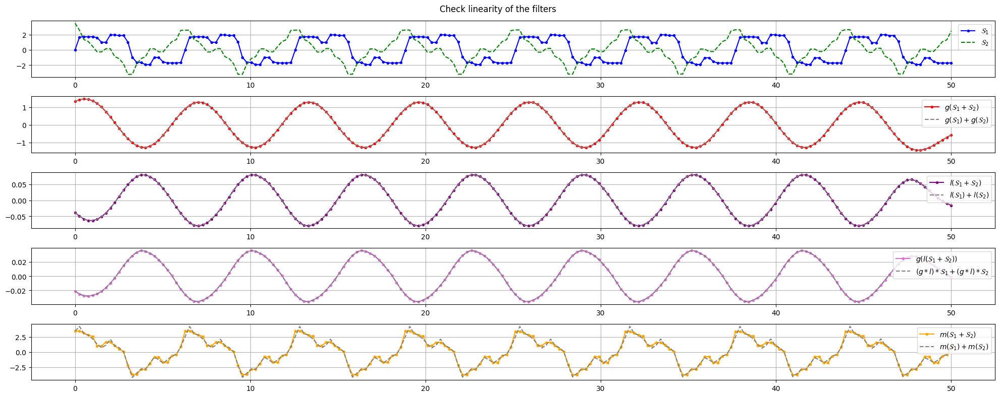

In [17]:
fig, axs = plt.subplots(5, 1)
fig.suptitle("Check linearity of the filters")
ys = [
    s1,
    s2,
    g_s1_s2,
    g_s1_g_s2,
    l_s1_s2,
    l_s1_l_s2,
    g_l_s1_s2,
    g_l_s1_g_l_s2,
    m_s1_s2,
    m_s1_m_s2,
]
labels = [
    "$\mathcal{S}_1$",
    "$\mathcal{S}_2$",
    "$g(\mathcal{S}_1 + \mathcal{S}_2)$",
    "$g(\mathcal{S}_1) + g(\mathcal{S}_2)$",
    "$l(\mathcal{S}_1 + \mathcal{S}_2)$",
    "$l(\mathcal{S}_1) + l(\mathcal{S}_2)$",
    "$g(l(\mathcal{S}_1 + \mathcal{S}_2))$",
    "$(g * l) * \mathcal{S}_1 + (g * l) * \mathcal{S}_2$",
    "$m(\mathcal{S}_1 + \mathcal{S}_2)$",
    "$m(\mathcal{S}_1) + m(\mathcal{S}_2)$",
]
colors = [
    "blue",
    "green",
    "red",
    "gray",
    "purple",
    "gray",
    "orchid",
    "gray",
    "orange",
    "gray",
]
for y_idx in range(0, len(ys), 2):
    i = y_idx // 2
    axs[i].plot(x, ys[y_idx], ".-", label=labels[y_idx], color=colors[y_idx])
    axs[i].plot(
        x, ys[y_idx + 1], "--", label=labels[y_idx + 1], color=colors[y_idx + 1]
    )
    axs[i].grid()
    axs[i].legend(loc="upper right")
fig.tight_layout()
plt.show()


#### **Question 1.2: 2D Filters *(4/9 Points)***



##### **2-D Laplacian filter**

The function should take an image as input and return the result of the convolution of the image with a 2-D Laplacian kernel.
You can use Python’s `convolve2D` function if you don’t want to implement it yourself - it hase been aliased as `conv2` and `convolve`.

See the figure below for an illustration of Laplacian filtering.

![](./images/stella_laplace.jpg)

In [18]:
def laplacefiltering2D(img: np.ndarray, sigma: int, filter_size: int = 3) -> np.ndarray:
    """
    Implement a 2D Laplacian filter.

    Args:
        img (np.ndarray): Input image.
        sigma (int): Standard deviation.
        filter_size (int): Filter size.

    Returns:
        smooth_img (np.ndarray): Smoothed image.
    """

    #Here we define the 1D Laplace filter using the laplace function defined above
    laplace_1d, _ = laplace(sigma, filter_size)

    #Here we define the 2D Laplace filter by taking the outer product of two 1D Laplace filters
    #This is done because in this way we can apply the 1D Laplace filter to the rows and columns of the image in a single step 
    laplacian_2d = np.outer(laplace_1d, laplace_1d)

    #Here we apply the 2D Laplace filter to the image using the convolve2d function from scipy.signal
    smooth_img = conv2(img, laplacian_2d, mode='same')

    #Here we return the smoothed image
    return smooth_img


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

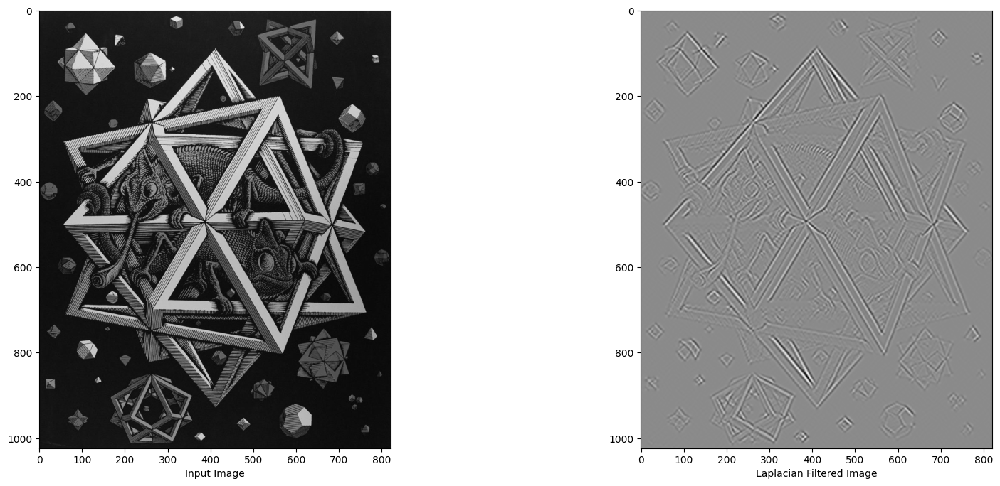

In [19]:
img = rgb2gray(np.array(Image.open("./images/stella.jpg")))
smooth_img = laplacefiltering2D(img, 3)

imgs = [img, smooth_img]
labels = ["Input Image", "Laplacian Filtered Image"]

plot_pictures(imgs, labels, nrows=1, ncols=2, cmap="gray", vmin=None, vmax=None)


##### **2-D Box filter**

The function should take an image as input and return the result of the convolution of this img with a 2D Box kernel.
Beware of errors in the following code, find them, and correct them.
You will be provided with the img to which the correct box filter has already been applied and you can use the SSIM metric to check that your result is correct, $SSIM = 1$ means that it is correct.

See the figure below for an illustration of Box filtering.

![](./imgs/box_img.jpg)

In [20]:
def boxfiltering(img: np.ndarray, filter_size: int) -> np.ndarray:
    """
    Implement a 2D Box filter, leveraging the previous box.

    Args:
        img (np.ndarray): Input image.
        filter_size (int): Filter size.

    Returns:
        smooth_img (np.ndarray): Smoothed image.
    """
    #Here we define the 1D Box filter using the box function defined above
    kernel, _ = box(filter_size)

    #Here we first apply the 1D Box filter to the rows of the image using the convolve function from scipy.signal
    #We use the apply_along_axis function to apply the convolve function to each row of the image
    partial = np.apply_along_axis(convolve, 0, img, kernel, mode="same")

    #Here we apply the 1D Box filter to the columns of the image using the convolve function from scipy.signal
    #We use the apply_along_axis function to apply the convolve function to each column of the image
    smooth_img = np.apply_along_axis(convolve, 1, partial, kernel, mode="same")

    #Here we return the smoothed image
    return np.array(smooth_img)


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

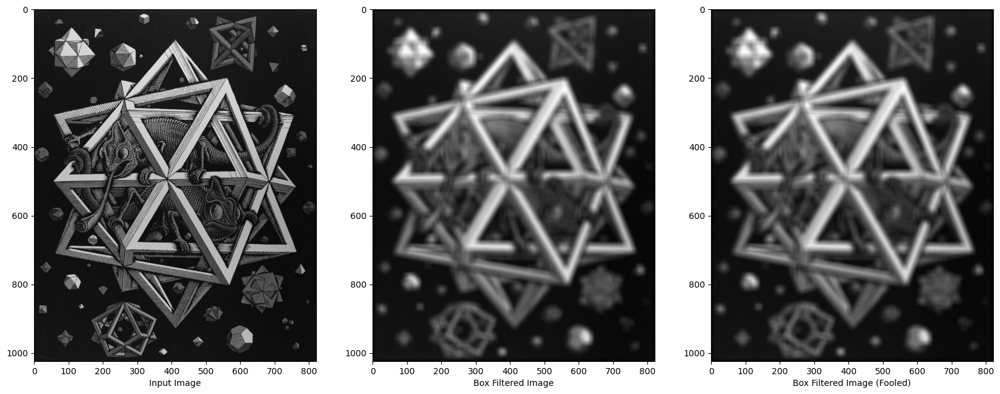

real_ssim_score:	1.0
your_ssim_score:	1.0000000000000007


In [21]:
img = rgb2gray(np.array(Image.open("./images/stella.jpg")))
smooth_img = np.load("assets/box_filter.npy")
smooth_fooled = boxfiltering(img, 20)


imgs = [img, smooth_img, smooth_fooled]
labels = ["Input Image", "Box Filtered Image", "Box Filtered Image (Fooled)"]

plot_pictures(imgs, labels, nrows=1, ncols=3, cmap="gray", vmin=None, vmax=None)

print(
    f"real_ssim_score:\t{ssim(smooth_img, smooth_img, data_range=smooth_img.max() - smooth_img.min())}\nyour_ssim_score:\t{ssim(smooth_img, smooth_fooled, data_range=smooth_img.max() - smooth_img.min())}"
)



##### **Separability and computational efficiency**

Consider the Laplacian operator defined as $\nabla^2 = \frac{\partial^2}{\partial x^2} + \frac{\partial^2}{\partial y^2}$. Consider the Gaussian $G(i,j) = \exp \left(-\frac{i^2 + j^2}{2\sigma^2}\right)$ (for simplicity, omit the factor $\frac{1}{2\pi \sigma^2}$) and its Laplacian $\nabla^2 G(i,j)$.

Analytically prove that the convolution:

$$h(i,j) = f(i,j) \ast \left(\nabla^2 G(i,j) \right)$$

can be decomposed into the sum of convolutions with 1D filters.

##### **Proof:**
-------------------------------------------------------

Let's consider the Gaussian $G(i,j) = \exp \left(-\frac{i^2 + j^2}{2\sigma^2}\right)$. We have can calculate each individual term of the Laplacian operator applied to $G(i,j)$ as:


\begin{align}
\frac{\partial^2 G(i,j)}{\partial i^2} =& \frac{\partial}{\partial i} \left(-\frac{i}{\sigma^2}\exp \left(-\frac{i^2 + j^2}{2\sigma^2}\right)\right) = \left(\frac{i^2}{\sigma^4}\exp \left(-\frac{i^2 + j^2}{2\sigma^2}\right) - \frac{1}{\sigma^2}\exp \left(-\frac{i^2 + j^2}{2\sigma^2}\right) \right) = \left(\frac{i^2}{\sigma^4} - \frac{1}{\sigma^2} \right)\exp \left(-\frac{i^2 + j^2}{2\sigma^2}\right) \nonumber\\
=& \frac{1}{\sigma^4}(i^2 - \sigma^2)G(i,j)
\tag{1}
\end{align}

\begin{align}
\frac{\partial^2 G(i,j)}{\partial j^2} =& \frac{\partial}{\partial j} \left(-\frac{j}{\sigma^2}\exp \left(-\frac{i^2 + j^2}{2\sigma^2}\right)\right) = \left(\frac{j^2}{\sigma^4}\exp \left(-\frac{i^2 + j^2}{2\sigma^2}\right) - \frac{1}{\sigma^2}\exp \left(-\frac{i^2 + j^2}{2\sigma^2}\right) \right) = \left(\frac{j^2}{\sigma^4} - \frac{1}{\sigma^2} \right)\exp \left(-\frac{i^2 + j^2}{2\sigma^2}\right) \nonumber\\
=& \frac{1}{\sigma^4}(j^2 - \sigma^2)G(i,j)
\tag{2}
\end{align}

Notice also, that the 2D Gaussian $G(i,j) = \exp \left(-\frac{i^2 + j^2}{2\sigma^2}\right)$ can be written as the product of two 1D Gaussians as:


\begin{equation}
G(i,j) = \exp \left(-\frac{i^2 + j^2}{2\sigma^2}\right) =  \exp \left(-\frac{i^2}{2\sigma^2}\right) \cdot \exp \left(-\frac{j^2}{2\sigma^2}\right) =: G(i) \cdot G(j)
\tag{3}
\end{equation}

This means that the Laplacian operator applied to $G(i,j)$ can be written as:

\begin{equation}
\nabla^2 G(i,j) = \frac{1}{\sigma^4}(i^2 - \sigma^2)G(i) \cdot G(j) + \frac{1}{\sigma^4}(j^2 - \sigma^2)G(i) \cdot G(j)
\tag{4}
\end{equation}



Now, using the definition of convolution, we can calculate the $h(i,j) = f(i,j) \ast \left(\nabla^2 G(i,j) \right)$ convolution as:

\begin{align}
h(i,j) = f(i,j) \ast \left(\nabla^2 G(i,j) \right) =& \sum_{k}\sum_{l} \left(\nabla^2 G(k,l) \right)f(i-k,j-l) \nonumber \\
=& \sum_{k}\sum_{l} \left(\frac{1}{\sigma^4}(k^2 - \sigma^2)G(k) \cdot G(l) + \frac{1}{\sigma^4}(l^2 - \sigma^2)G(k) \cdot G(l) \right)f(i-k,j-l) \nonumber \\
=& \sum_{k}\left(\frac{1}{\sigma^4}(k^2 - \sigma^2)G(k)\right)\underbrace{\sum_{l}  G(l)f(i-k,j-l)}_{\text{g'}} +\sum_{k}G(k) \underbrace{\sum_{l} \left(\frac{1}{\sigma^4}(l^2 - \sigma^2) G(l) \right)f(i-k,j-l)}_{\text{g''}},
\tag{5}
\end{align}

where the first line follows from the definition of convolution, the second one follows from $(4)$, and the third line follows from the separability and associativity of the sum. It is important to notice that in $(5)$, the terms $g'$ and $g''$ are 1D horizontal convolutions with Gaussians, this is why we can rewrite this line as:

\begin{align}
h(i,j) = f(i,j) \ast \left(\nabla^2 G(i,j) \right) =& \underbrace{\sum_{k}\left(\frac{1}{\sigma^4}(k^2 - \sigma^2)G(k)\right)g'(i-k,j)}_{\text{h'}} +\underbrace{\sum_{k}G(k) g''(i-k,j)}_{\text{h''}},
\tag{6}
\end{align}

and we can notice that also in  $(6)$ the terms $h'$ and $h''$ are 1D vertical convolutions with 1D filters, this is why we can finally rewrite this convolution as:

\begin{equation}
\boxed{h(i,j) = h'(i,j) + h''(i,j)},
\tag{7}
\end{equation}

where $h'(i,j)$ and $h''(i,j)$ are convolutions of $f$ with 1D linear filters. 

$$\hspace{20cm}\blacksquare$$


-------------------------------------------------------

Briefly explain why it is more convenient computationally speaking to use two 1D Laplacian filters rather than one 2D Laplacian filter.
Assume that the dimension of the 2D Laplacian filter is $k^2$ and that the dimension of the two 1D Laplacian filters is $k$.

##### **Explanation:**
-------------------------------------------------------

Using two 1D Laplacian filters rather than one 2D Laplacian filter is more computationally convenient in terms of efficiency. The reason for this lies in the reduction of the number of operations required. Let's elaborate on this:

- Assuming the dimension of the 2D Laplacian filter is $k^2$, when we apply this filter to an image, we perform a convolution operation, which involves element-wise multiplications and sums of the filter with each region of the image. For each pixel in the filtered image, we need to perform $k^2$ multiplications and sums. These operations are done for every pixel in the image, therefore, assuming we have $N$ pixels in a given image, we perform:

\begin{equation}
N \cdot k^2 \text{ operations in total}
\tag{1}
\end{equation}

- On the other hand, when we use two 1D Laplacian filters, we split the 2D convolution into two 1D convolutions:
    
    1. First, we apply the first 1D Laplacian filter along the rows of the image. In this case, for each pixel we would need to perform $k$ multiplications and sums. Thus, in total, we perform $N \cdot k$ operations in the image.

    2. Then, we apply the second 1D Laplacian filter along the columns of the image. Also in this case, for each pixel we would need to perform $k$ multiplications and sums. Thus, in total, we perform $N \cdot k$ operations in the image.

    Therefore the total number of operations we would perform when applying the two 1D Laplacian filters is:
    
    \begin{equation}
    2k \cdot N  \text{ operations in total}
    \tag{2}
    \end{equation}

As we can see from $(1)$, the time complexity for the 2D Laplacian filter is $O(k^2)$ and so the computational cost increases quadratically with $k$. On the other side, the time complexity for applying two 1D Laplacian filters is $O(k)$ and therefore the computational cost increases linearly with $k$. So, in summary, breaking down the 2D Laplacian filter into two 1D filters reduces the number of operations needed for convolution, making it computationally more convenient and faster, especially for larger filter sizes. 

-------------------------------------------------------

##### **Practical example of separability**

Up to this point, we have seen that both the Gaussian and the Laplacian operators are linear and you have explicitly proven that the Laplacian operator is separable. 
As you may guess, the Gaussian operator is also separable, and so is the composition of them: the Laplacian of Gaussian (LoG) operator. 
Recall from section section "2-D Laplacian filter" that the LoG operator is defined as:

\begin{equation}
\nabla^2 \circ G = \frac{d^2G(x)}{dx^2}=-\frac{\sigma^2 - x^2}{\sqrt{2\pi}\sigma^5}\exp\left(-\frac{x^2}{2\sigma^2}\right)
\end{equation}

Previously, you have implemented a 2-D LoG filter without leveraging the separability property.
In this section, you're asked to implement again the 2-D LoG filter **exploiting the separability**, i.e. convolving the image with a separable 1-D Laplacian kernel along axes.

Compare the images to check that the separability property is valid. Note that the last image shows the differences between the separable case and the non separable case: it should be black up to numerical approximations, i.e. it should cointain approximately 0 everywhere.

In [22]:
def laplacefiltering(img: np.ndarray, sigma: int, filter_size: int = 3) -> np.ndarray:
    """
    Implement a 2D Laplacian filter, leveraging the previous laplacian and the separability property.

    Args:
        img (np.ndarray): Input image.
        sigma (int): Standard deviation.
        filter_size (int): Filter size.

    Returns:
        derived_img (np.ndarray): Derived image.
    """
    
    kernel, _ = laplace(sigma, filter_size)

    # Compute Gaussian on rows
    partial = np.apply_along_axis(convolve, 0, img, kernel, mode="same")

    # Compute Gaussian on columns
    derived_img = np.apply_along_axis(convolve, 1, partial, kernel, mode="same")

    return derived_img


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

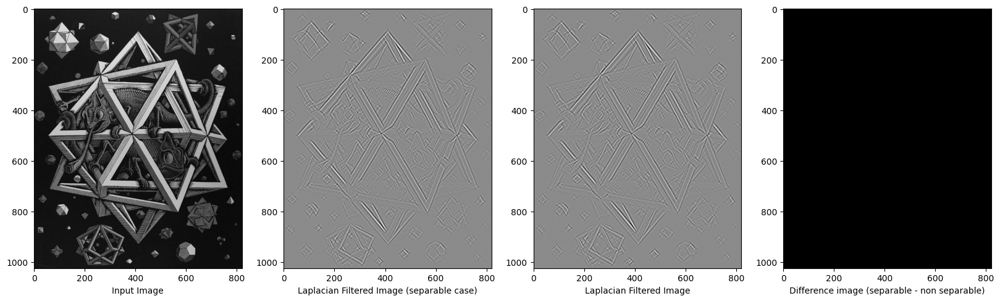

In [23]:
img = rgb2gray(np.array(Image.open("images/stella.jpg")))
derived_img_separable = laplacefiltering(img, sigma=3)
derived_img_non_separable = laplacefiltering2D(img, sigma=3)
difference_img = derived_img_separable - derived_img_non_separable

plt.figure(2)
ax1 = plt.subplot(1, 4, 1)
ax1.set_xlabel("Input Image")
ax2 = plt.subplot(1, 4, 2)
ax2.set_xlabel("Laplacian Filtered Image (separable case)")
ax3 = plt.subplot(1, 4, 3)
ax3.set_xlabel("Laplacian Filtered Image")
ax4 = plt.subplot(1, 4, 4)
ax4.set_xlabel("Difference image (separable - non separable)")


plt.sca(ax1)
plt.imshow(img, cmap="gray")
plt.sca(ax2)
plt.imshow(derived_img_separable, cmap="gray")
plt.sca(ax3)
plt.imshow(derived_img_non_separable, cmap="gray")
plt.sca(ax4)
plt.imshow(difference_img, cmap="gray", vmin=0, vmax=255)
plt.show()


##### **Gaussian Blur Filter**

Implement a 2D Gaussian filter.

See the figure below for an illustration of the sharpening filter:

![](./images/moon_gauss.jpg)

In [24]:
def gaussfiltering(img: np.ndarray, sigma: int) -> np.ndarray:
    """
    Implement a 2D Gaussian filter, leveraging the previous gauss.

    Args:
        img (np.ndarray): Input image.
        sigma (int): Standard deviation.

    Returns:
        smooth_img (np.ndarray): Smoothed image.
    """

    kernel, _ = gauss(sigma)

    # Compute Gaussian on rows
    partial = np.apply_along_axis(convolve, 0, img, kernel, mode="same")

    # Compute Gaussian on columns
    smooth_img = np.apply_along_axis(convolve, 1, partial, kernel, mode="same")

    return np.array(smooth_img)


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

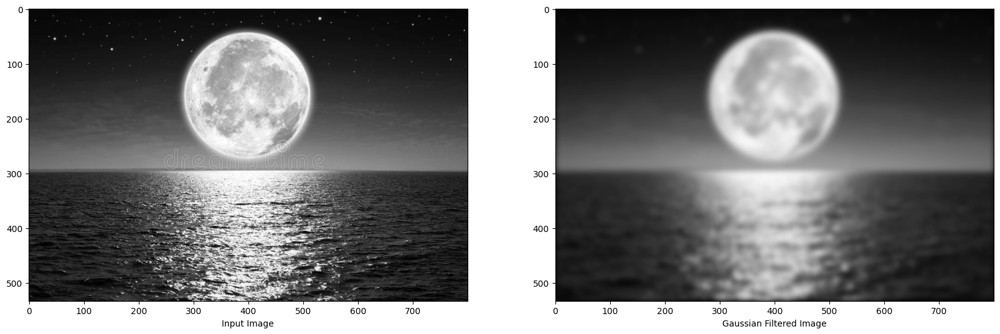

In [25]:
img = rgb2gray(np.array(Image.open("images/moon.jpg")))
imgs = [img, gaussfiltering(img, 5)]
labels = ["Input Image", "Gaussian Filtered Image"]
plot_pictures(imgs, labels, nrows=1, ncols=2, cmap="gray", vmin=0, vmax=255)


### **#1 Report *(1/9 Points)***

Use the images from the previous exercises to write a report on what you learned about filters and convolutions **(in the text block below)**.

Write the filter that was used to produce the images.

![](./images/report1_ex2.png)

#### **Report:**
--------------------------------------------

In this section we learned about diverse types of 2D filters (Laplacian, Box and Gaussian) along with the property of filter separability and the advantage on applying several 1D filters with respect to applying a multi-dimensional filter just once. On this report we will talk about the types of filters and the examples we observed during the exercises of this section:

* **2D Laplacian Filter**: In this exercise we built a 2D Laplacian Filter, or more specifically, a 2D LoG filter since it was defined as the Laplacian of a Gaussian. This filter highlights regions in an image where the intensity changes rapidly, since it computes the second derivative in both directions, helping on extracting features and identifying edges. The process of applying this filter is as follows:
    
    1.  In order to reduce noise and eliminating fine details in the image, we first apply a Gaussian filter for smoothing.
    2. After applying Gaussian smoothing, the Laplacian operator is used to compute the second derivative of the image. Thus, highlighting regions where the intensity changes significantly in any direction.
    3. The result of this convolution is an image where positive values indicate regions where the intensity is increasing, and negative values indicate regions where the intensity is decreasing. Zero values indicate relatively flat regions.

    In the image of this exercise we can see that the 2D Laplacian filter highlights the edge of all the stars within the image and some fine details on the back of the chameleon as well.

* **2D Box Filter**: In this exercise we built a 2D Box filter taking advantage of its separability property, applying two 1D Box filters along the rows and columns of an image. A Box Filter is a simple average filter that smooths an image and reduces noise. The resulting image after this filter is a new image where each pixel represents the average value of the surrounding pixels within the kernel. This filter reduces noise and sharp transitions in intensity within an image. However, it can blur edges and fine details in the image since it averages pixel values over a neighborhood.

    As we can see in the image example above, when applying the 2D Box filter we can observe an homogeneous blurring without preserving any kind of detail within the image. Specifically we can see that the edged of the stars in the picture are blurred, which would result in a poor edge detection if we try to apply a Laplacian afterwards.

* **Practical Example of Separability**: In this exercise we compared the results of applying a 2D Laplacian filter and two 1D Laplacian filters (on the rows and columns) to an image. As we can see, the result is exactly the same thus numerically proving the separability property of the Laplacian filter. This part has been explained in more detail when we proved that the convolution: $h(i,j) = f(i,j) \ast \left(\nabla^2 G(i,j) \right)$ can be decomposed into the sum of convolutions with 1D filters.

* **Gaussian Blur Filter**: In this exercise we built a 2D Gaussian Blur Filter taking advantage of its separability property, applying two 1D Gaussian filters along the rows and columns of an image. The Gaussian filter is designed to reduce noise and blur an image while preserving the overall structure and important features. The result of the convolution is a new image in which each pixel represents a weighted average of its surrounding pixels. The choice of the standard deviation $\sigma$ determines the level of smoothing, with larger $\sigma$ values resulting in more significant smoothing. As we've seen with the Laplacian filter, it is useful for denoising and pre-processing images before performing edge detection or feature extraction.

    As we can see in the image example above, when applying the Gaussian Blur filter, we effectively blurred the "dreamstime" letters and some of the smaller stars in the original image while preserving the details of the moon and the sea. On the contrary to the 2D Box filter, we can see that the Gaussian filter preserves details in an image while taking out noise.


In conclusion, these 2D filters offer different capabilities for image processing, from edge detection with the Laplacian filter to noise reduction and feature preservation with the Gaussian filter. Also, understanding filter separability enhances computational efficiency and can be crucial while working with large filter sizes. Now, using our acquired knowledge, we can see that the filters that were used to produce the images above were:

- Image A filter -> **2-D Box Filter**. The colors in this image are uniform and the contrast is high. This uniformity is a sign of a 2-D Box Filter.

- Image B filter -> **Gaussian Blur Filter**. The colors in this image are slightly softer and the contrast is slightly lower than image A. These are is a sign of a Gaussian Blur Filter.

- Image C filter -> **2-D Laplacian Filter**. This image has a strong contrast between edges and background. This is a typical element of a 2D Laplacian Filter.

--------------------------------------------

## **Question 2: Multi-Scale Image Representations** *(9 Points)*

Edges represents object boundaries, thus edge detection is a very important preprocessing step for any object detection or recognition process.
Simple edge detection kernels are based on approximation of gradient images.

You will use some basic edge detection kernels.

#### **Question 2.1: Sobel Operator** *(1/9 Points)*


The Sobel operator is used in image processing, particularly within edge detection algorithms.
Technically, it is a discrete differentiation operator, computing an approximation of the gradient of the image intensity function.

See figure below for illustration of Sobel operators in action:

![](./images/valve_sobel.png)

In [26]:
def sobel_x(img: np.ndarray) -> np.ndarray:
    """
    Implement a 3x3 Sobel discrete operator for vertical edges.

    Args:
        img (np.ndarray): Input image.

    Returns:
        Fx (np.ndarray): Image with vertical edges.
    """

    #Here we define the 3x3 Sobel discrete operator for vertical edges
    vertical_sobel = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])

    #Here we apply the Sobel operator to the image using the convolve2d function from scipy.signal
    Fx = conv2(img, vertical_sobel, mode="same")

    #Here we return the image with vertical edges
    return Fx


In [27]:
def sobel_y(img: np.ndarray) -> np.ndarray:
    """
    Implement a 3x3 Sobel discrete operator for horizontal edges.

    Args:
        img (np.ndarray): Input image.

    Returns:
        Fy (np.ndarray): Image with horizontal edges.
    """

    #Here we define the 3x3 Sobel discrete operator for horizontal edges
    horizontal_sobel = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

    #Here we apply the Sobel operator to the image using the convolve2d function from scipy.signal
    Fy = conv2(img, horizontal_sobel, mode="same")

    #Here we return the image with horizontal edges
    return Fy


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

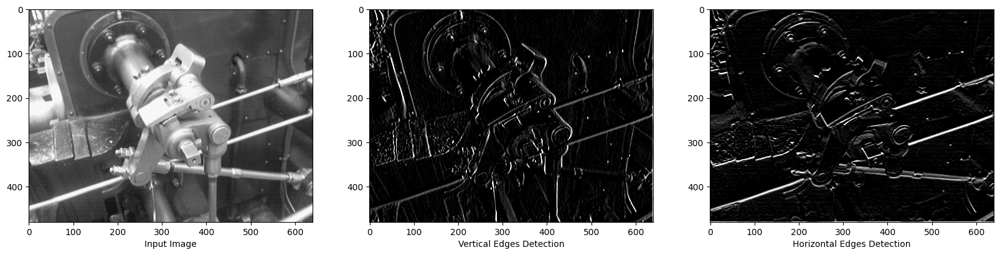

In [28]:
img = rgb2gray(np.array(Image.open("images/valve.png")))
imgs = [img, sobel_x(img), sobel_y(img)]
labels = ["Input Image", "Vertical Edges Detection", "Horizontal Edges Detection"]
plot_pictures(imgs, labels, nrows=1, ncols=3, cmap="gray", vmin=0, vmax=255)


#### **Question 2.2: Gradient Magnitude** *(1/9 Points)*
Using the previously defined functions `sobel_x` and `sobel_y`, retrieve the gradient magnitude of the image.

See the figure below for an illustration of the Gradient Magnitude:

![](./images/sobel.png)

In [29]:
def gradient_magnitude(img: np.ndarray) -> np.ndarray:
    """
    Apply the Sobel operator to the image and compute the gradient magnitude.

    Args:
        img (np.ndarray): Input image.

    Returns:
        magnitude (np.ndarray): Gradient magnitude.
    """

    #Here we apply the Sobel operator to the image using the functions defined above
    Fx = sobel_x(img)
    Fy = sobel_y(img)

    #Here we compute the gradient magnitude using the np.sqrt function
    magnitude = np.sqrt(Fx**2 + Fy**2)

    #Here we return the gradient magnitude
    return magnitude


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

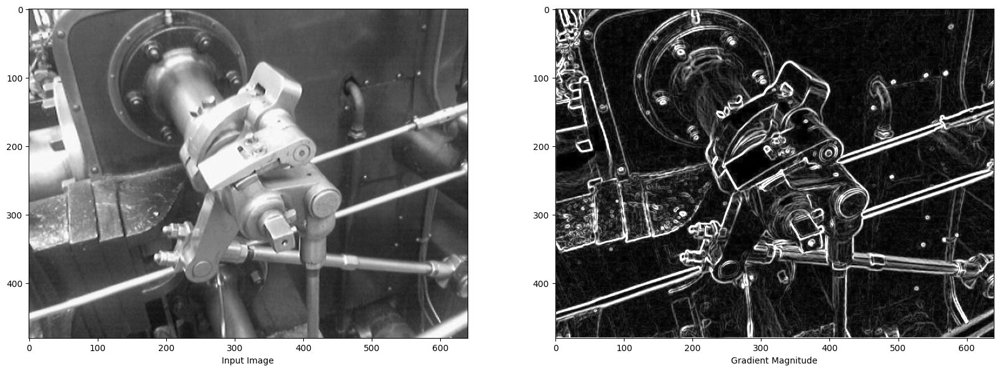

In [30]:
img = rgb2gray(np.array(Image.open("images/valve.png")))
igms = [img, gradient_magnitude(img)]
labels = ["Input Image", "Gradient Magnitude"]
plot_pictures(igms, labels, nrows=1, ncols=2, cmap="gray", vmin=0, vmax=255)


#### **Question 2.3 Discrete Laplacian Operator** *(2/9 Points)*

Write the discrete Laplacian filter and given an image $x$, a Gaussian filter $G(x)$ and a discrete Laplacian filter $L(x)$, compute:
- $ G(L(x)) $
- $ L(G(x)) $
Provide a brief explanation of the result obtained.

See the figure below for illustration of the discrete Laplacian:

![](./images/laplacian.png)

In [31]:
# from scipy.ndimage import gaussian_filter
def discrete_laplace(img: np.ndarray) -> np.ndarray:
    """
    Discrete Laplacian operator.

    Args:
        img (np.ndarray): Input image.

    Returns:
        Lap (np.ndarray): Image after applying the Laplacian operator.
    """

    #Here we define the 3x3 Laplacian discrete operator
    laplacian_kernel = np.array([[0, 1, 0],
                                 [1, -4, 1],
                                 [0, 1, 0]])

    #Here we apply the Laplacian operator to the image using the convolve2d function from scipy.signal
    Lap = convolve(img, laplacian_kernel)

    #Here we return the image after applying the Laplacian operator
    return Lap


In [32]:
img = rgb2gray(np.array(Image.open("./images/lenna.jpg")))
sigma = 1.0

image_edges = discrete_laplace(img)
image_edges_smoothed = gaussfiltering(image_edges, sigma=sigma)

image_smoothed = gaussfiltering(img, sigma=sigma)
image_smoothed_edges = discrete_laplace(image_smoothed)


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

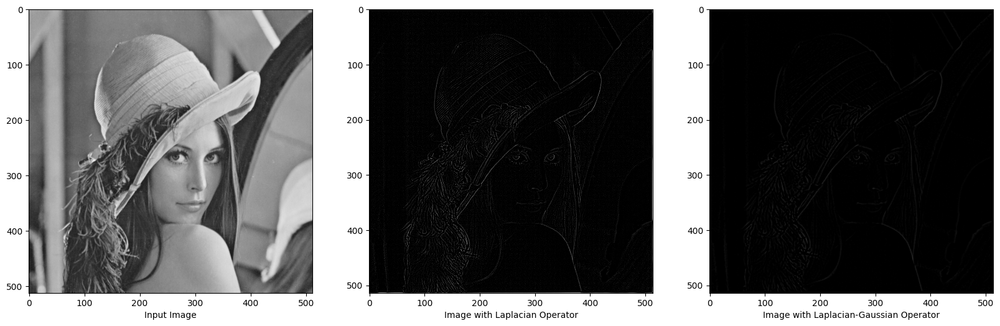

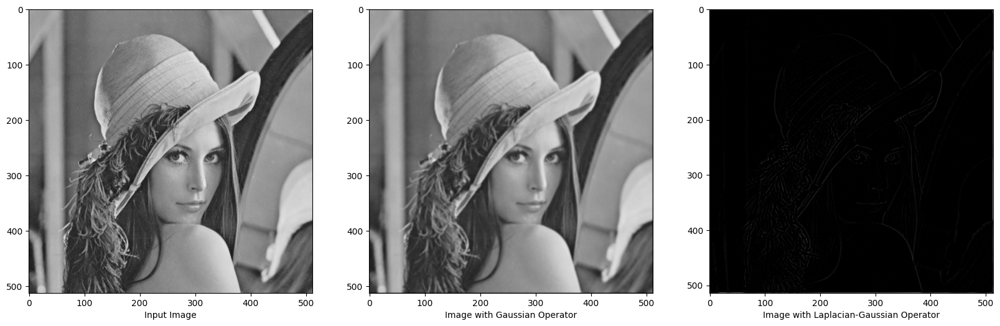

ssim_score = 1


In [33]:
# LoG
imgs = [img, image_edges, image_edges_smoothed]
labels = [
    "Input Image",
    "Image with Laplacian Operator",
    "Image with Laplacian-Gaussian Operator",
]
plot_pictures(imgs, labels, nrows=1, ncols=3, cmap="gray", vmin=0, vmax=255)

# GoL
imgs = [img, image_smoothed, image_smoothed_edges]
labels = [
    "Input Image",
    "Image with Gaussian Operator",
    "Image with Laplacian-Gaussian Operator",
]
plot_pictures(imgs, labels, nrows=1, ncols=3, cmap="gray", vmin=0, vmax=255)


print(
    "ssim_score =",
    round(
        ssim(
            image_edges_smoothed,
            image_smoothed_edges,
            data_range=image_edges_smoothed.max() - image_edges_smoothed.min(),
        )
    ),
)


#### **Question: 2.4 Canny Edge Detector and Template Matching** *(3/9 Points)*
The Canny edge detector is an edge detection operator that uses a multi-stage algorithm to detect a wide range of edges in images.

The Canny edge detection algorithm is composed of 5 steps:

1. Noise reduction: apply Gaussian filter to smooth the image in order to remove the noise
2. Gradient calculation: find the intensity gradients of the image
3. Non-maximum suppression: apply gradient magnitude thresholding or lower bound cut-off suppression to get rid of spurious response to edge detection
4. Double threshold: apply double threshold to determine potential edges
5. Edge Tracking by Hysteresis: track edge by hysteresis: finalize the detection of edges by suppressing all the other edges that are weak and not connected to strong edges.


You can learn more about the Canny edge detector at the following links:
- [Canny Edge Detection](https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html).
- [Canny Edge Detection Step by Step in Python — Computer Vision](https://towardsdatascience.com/canny-edge-detection-step-by-step-in-python-computer-vision-b49c3a2d8123).
- [What is a Canny Edge Detection Algorithm?](https://towardsai.net/p/computer-vision/what-is-a-canny-edge-detection-algorithm).

##### **Stage 1** - *Noise reduction*

Apply Gaussian filter to smooth the image in order to remove the noise. 
**You just need to run the code for this stage**.

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

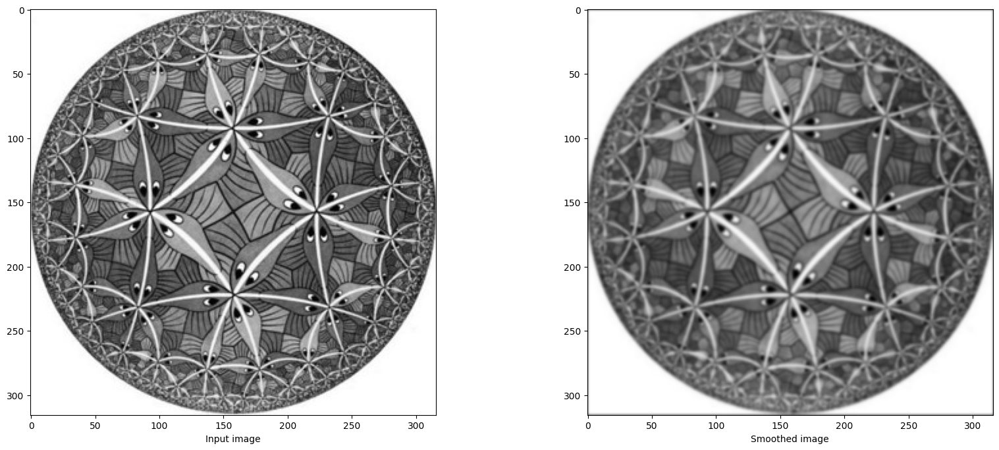

In [34]:
# STEP 1:
img = rgb2gray(np.array(Image.open("images/escher_circle.jpg")))
smoothed_img = gaussfiltering(img, sigma=1)

plot_pictures([img, smoothed_img], ["Input image", "Smoothed image"], 1, 2, vmax=255)


##### **Stage 2** - *Gradient calculation*

This step detects edges intensity and direction by calculating the gradient of the image through edge detection operators.

Edges correspond to a change of pixels’ intensity, the easiest way to detect it is applying filters that highlight it in both directions: horizontal ($x$) and vertical ($y$).

When the image is smoothed, the derivatives $D_x(I)$ and $D_y(I)$ w.r.t. $x$ and $y$ are calculated. 
It can be implemented by convolving $I$ with Sobel kernels $K_x$ and $K_y$, respectively.

Taking advantage of the functions `sobel_x` and `sobel_y` you have previously implemented, compute the gradient magnitude and direction of the image.
Your function will output the magnitude $G$ and the slope $\theta$ of the gradient. 
Scale the magnitude to the range $[0,255]$.

In [35]:
# STEP 2
def sobel_filters(img: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    """
    This function applies the sobel filter to the input image in x and y direction.
    Scale the magnitude to [0, 255] and return the magnitude and the direction of the gradient.

    Args:
        img (np.ndarray): input image

    Returns:
        G (np.ndarray): gradient magnitude
        theta (np.ndarray): gradient direction
    """

    #Here we apply the Sobel operator to the image using the functions defined above
    Fx = sobel_x(img)
    Fy = sobel_y(img)
    #Here we compute the gradient magnitude using the np.sqrt function
    G = np.sqrt(Fx**2 + Fy**2)
    #Here we scale the magnitude to [0, 255]
    G = G / G.max() * 255
    #Here we compute the gradient direction using the np.arctan2 function
    theta = np.arctan2(Fy, Fx)

    #Here we return the gradient magnitude and the gradient direction
    return (G, theta)


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

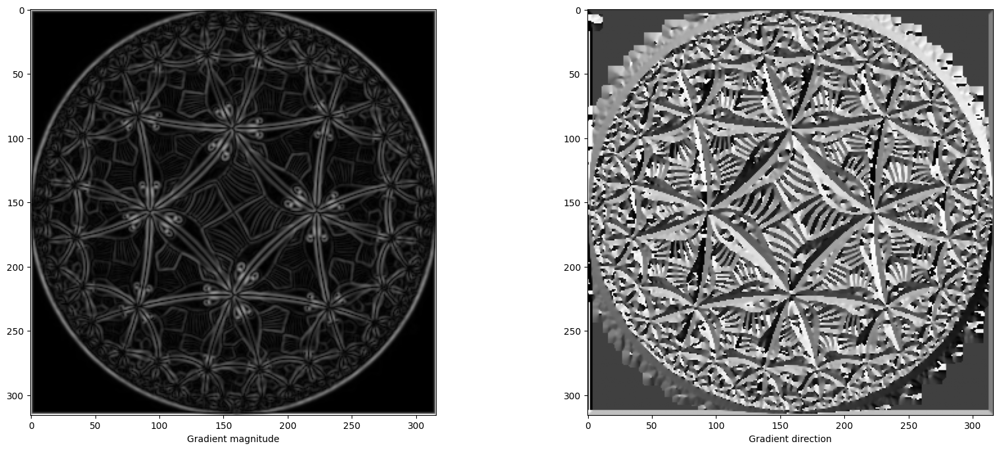

In [36]:
G, theta = sobel_filters(smoothed_img)

plot_pictures([G, theta], ["Gradient magnitude", "Gradient direction"], 1, 2)


##### **Stage 3** - *Non-maximum suppression*

The image is scanned along the image gradient direction and, if pixels are not part of the local maxima, they are set to zero. 
This has the effect of suppressing all image information that is not part of local maxima.

In [37]:
def non_max_suppression(img: np.ndarray, D: np.ndarray) -> np.ndarray:
    """
    This function performs non-maximum suppression on the input image.

    Args:
        img (np.ndarray): input image
        D (np.ndarray): gradient direction

    Returns:
        Z (np.ndarray): image after non-maximum suppression
    """
    #In order to develop this code I read the article https://towardsdatascience.com/canny-edge-detection-step-by-step-in-python-computer-vision-b49c3a2d8123 where they develop a similar approach
    
    #Here we define the dimensions of the image
    M, N = img.shape

    #Here we define the output image
    Z = np.zeros((M, N), dtype=np.uint8)

    #Here we define the angle in degrees
    PI = 180
    angle = (np.rad2deg(D) + PI) % PI

    #Here we loop over the values of the image
    for i in range(1, M - 1):
        for j in range(1, N - 1):
            #Here we initialize the intensity values of the neighbors
            neighbor_1 = 255
            neighbor_2 = 255

            #Here we check the angle of the gradient
            if (-PI/8 <= angle[i, j] <= PI/8) or (180-PI/8 <= angle[i, j] <= 180+PI/8):
                #If the angle is 0 degrees, we check the neighbors in the horizontal direction
                neighbor_1 = img[i, j+1]
                neighbor_2 = img[i, j-1]
            elif (45-PI/8 <= angle[i, j] <= 45+PI/8):
                #If the angle is 45 degrees, we check the neighbors in the diagonal direction
                neighbor_1 = img[i+1, j-1]
                neighbor_2 = img[i-1, j+1]
            elif (90-PI/8 <= angle[i, j] <= 90+PI/8):
                #If the angle is 90 degrees, we check the neighbors in the vertical direction
                neighbor_1 = img[i+1, j]
                neighbor_2 = img[i-1, j]
            elif (135-PI/8 <= angle[i, j] <= 135+PI/8):
                #If the angle is 135 degrees, we check the neighbors in the diagonal direction
                neighbor_1 = img[i-1, j-1]
                neighbor_2 = img[i+1, j+1]

            #Here we check if the intensity of the current pixel is greater than the intensity of the neighbors
            if img[i,j] == max(img[i,j], neighbor_1, neighbor_2):
                #If it is, we set the intensity of the current pixel to the output image
                Z[i,j] = img[i,j]
            else:
                #If it is not, we set the intensity of the current pixel to 0
                pass

    #Here we return the image after non-maximum suppression. We set it to go from 0 to 255        
    return (Z / Z.max() * 255).astype(np.uint8)


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

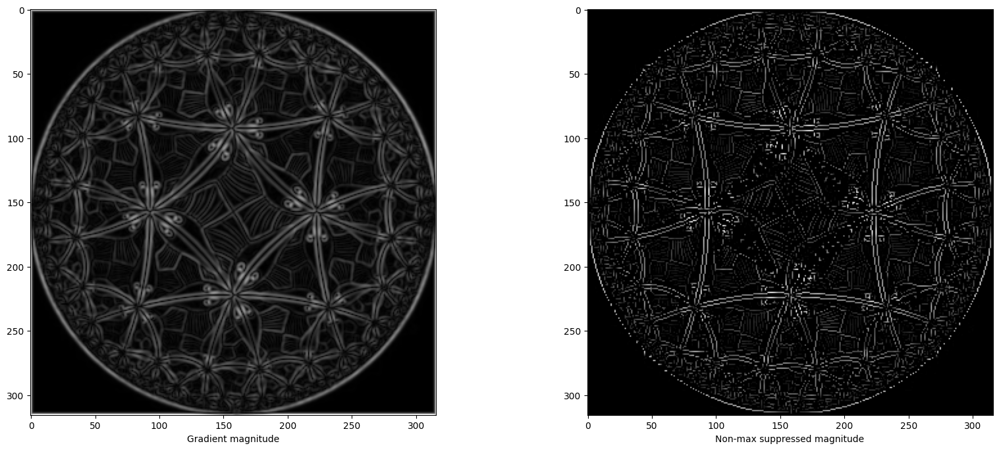

In [38]:
Z = non_max_suppression(G, theta)

plot_pictures(
    [G, Z],
    ["Gradient magnitude", "Non-max suppressed magnitude"],
    1,
    2,
)


##### **Stage 4** - *Thresholding*

After application of non-maximum suppression, remaining edge pixels provide a more accurate representation of real edges in an image. 
However, some edge pixels remain that are caused by noise and color variation. 
To account for these spurious responses, it is essential to filter out edge pixels with a weak gradient value and preserve edge pixels with a high gradient value. 

This is accomplished by selecting high and low threshold values: 
- If an edge pixel’s gradient value is higher than the high threshold value, it is marked as a strong edge pixel.
- If an edge pixel’s gradient value is smaller than the high threshold value and larger than the low threshold value, it is marked as a weak edge pixel. 
- If an edge pixel's gradient value is smaller than the low threshold value, it will be suppressed.

Implement the function `threshold` that takes as input the image, the low and high threshold ratios and returns a tuple whose elements are the thresholded image, the value of the weak edges and the value of the strong edges. Set the value of weak edges to 100 and the value of strong edges to 255.

In [39]:
# STEP 4
def threshold(
    img: np.ndarray, low_threshold: int = 100, high_threshold: int = 200
) -> np.ndarray:
    """
    This function applies a double thresholding to the input image.

    Args:
        img (np.ndarray): input image
        low_threshold (int): low threshold
        high_threshold (int): high threshold

    Returns:
        res (np.ndarray): thresholded image
    """
    #Here we define the dimensions of the image
    i_height, i_width = img.shape

    #Here we define the output image
    res = np.zeros((i_height, i_width), dtype=np.uint8)
    #Here we define the weak and strong intensities
    weak, strong = 100, 255

    #Here we obtain the indices of the pixels with intensity greater than the high threshold
    strong_i, strong_j = np.where(img >= high_threshold)
    #Here we obtain the indices of the pixels with intensity higher than the low threshold but lower than the high threshold
    weak_i, weak_j = np.where((img <= high_threshold) & (img >= low_threshold))

    #Here we set the intensity of the pixels with intensity greater than the high threshold to strong
    res[strong_i, strong_j] = strong
    #Here we set the intensity of the pixels with intensity higher than the low threshold but lower than the high threshold to weak
    #Obviously, the intensity of the pixels with intensity lower than the low threshold is set to 0
    res[weak_i, weak_j] = weak

    #Here we return the thresholded image along with the weak and strong intensities
    return (res, weak, strong)


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

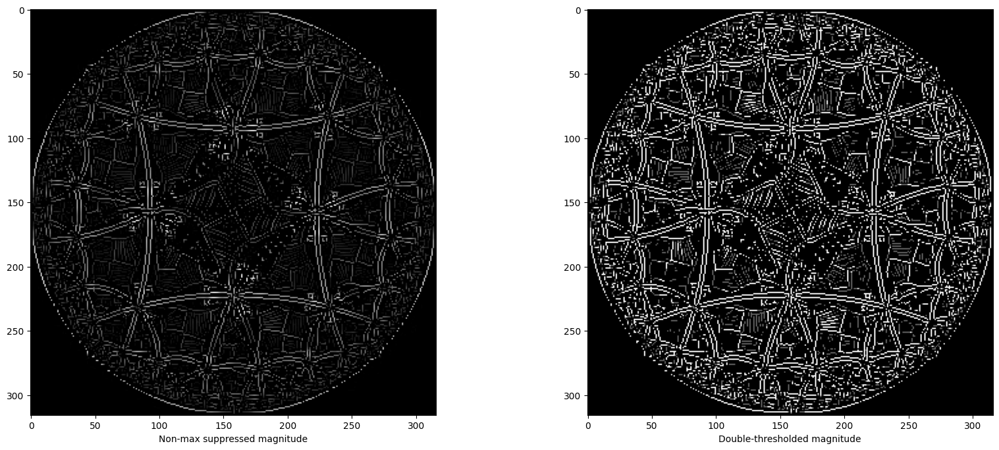

In [40]:
res, weak, strong = threshold(Z, low_threshold=25, high_threshold=50)

plot_pictures(
    [Z, res],
    ["Non-max suppressed magnitude", "Double-thresholded magnitude"],
    1,
    2,
)


##### **Stage 5** - *Hysteresis*

Based on the threshold results, the hysteresis consists of transforming weak pixels into strong ones, if and only if at least one of the pixels around the one being processed is a strong one.

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

In [41]:
# STEP 5
def hysteresis(img: np.ndarray, weak: int, strong: int = 255) -> np.ndarray:
    """
    This function applies hysteresis to the input image.

    Args:
        img (np.mdarray): input image.
        weak (int): weak threshold.
        strong (int): strong threshold.

    Returns:
        img (np.ndarray): image after hysteresis.
    """
    M, N = img.shape
    img_ = img.copy()
    strong_edges_idxs = np.argwhere(img == strong).tolist()
    while len(strong_edges_idxs) > 0:
        i, j = strong_edges_idxs.pop()
        if (i - 1 >= 0) and (j - 1 >= 0) and (i + 1 < M) and (j + 1 < N):
            weak_edges_mask = img_[i - 1 : i + 2, j - 1 : j + 2] == weak
            if np.any(weak_edges_mask):
                img_[i - 1 : i + 2, j - 1 : j + 2][weak_edges_mask] = strong
                weak_edges_idxs = (
                    (np.argwhere(weak_edges_mask) - 1) + np.array([i, j])
                ).tolist()
                strong_edges_idxs = strong_edges_idxs + weak_edges_idxs[::-1]
    img_[img_ != strong] = 0
    return img_


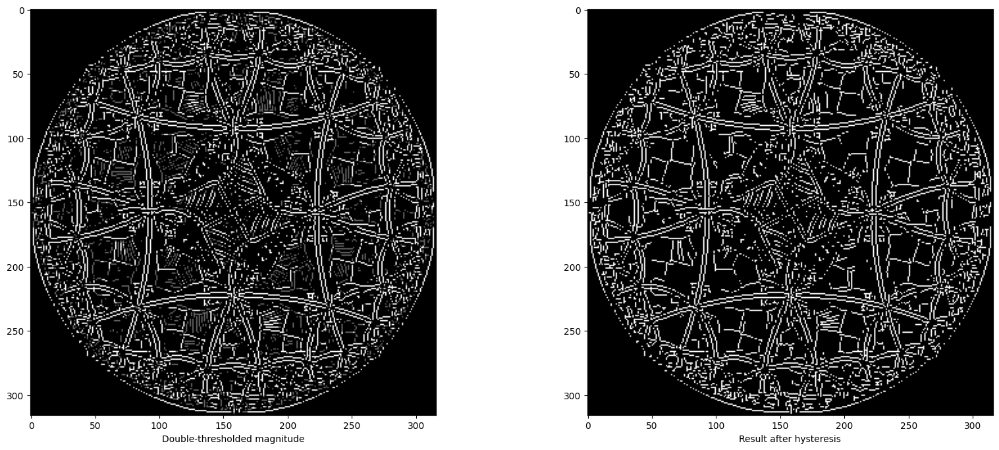

In [42]:
final_img = hysteresis(res, weak=weak)

plot_pictures(
    [res, final_img],
    ["Double-thresholded magnitude", "Result after hysteresis"],
    1,
    2,
)


##### **Wrap up**
Once you have seen how the Canny edge detector works step by step, implement the following `canny_edge_detector` function that wraps all the previous steps and returns the final image.

In [43]:
def canny_edge_detector(
    img: np.ndarray, sigma: int = 1, low_threshold: int = 50, high_threshold: int = 100
) -> np.ndarray:
    """
    This function implements the Canny edge detector.
    Put together the previous functions to implement the Canny edge detector.
    Don't apply the gaussian filter if sigma=0.

    Args:
        img (np.ndarray): input image
        sigma (int): standard deviation for the gaussian filter; if sigma=0, no gaussian filter is applied
        low_threshold (int): low threshold
        high_threshold (int): high threshold

    Returns:
        out_img (np.ndarray): image after applying the Canny edge detector
    """
    #Here we check if sigma is 0
    if sigma == 0:
        #If it is, we do not apply the Gaussian filter
        out_img = img
    else:
        #If it is not, we apply the Gaussian filter
        out_img = gaussfiltering(img, sigma=sigma)
    
    #Then, we apply the Sobel operator to the image using the functions defined above
    G, theta = sobel_filters(out_img)
    #We apply the non-maximum suppression to the image using the function defined above
    Z = non_max_suppression(G, theta)
    #We apply the double thresholding to the image using the function defined above
    res, weak, _ = threshold(Z, low_threshold=low_threshold, high_threshold=high_threshold)
    #Finally, we apply the hysteresis to the image using the function defined above
    out_img = hysteresis(res, weak=weak)

    #Here we return the image after applying the Canny edge detector
    return out_img


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

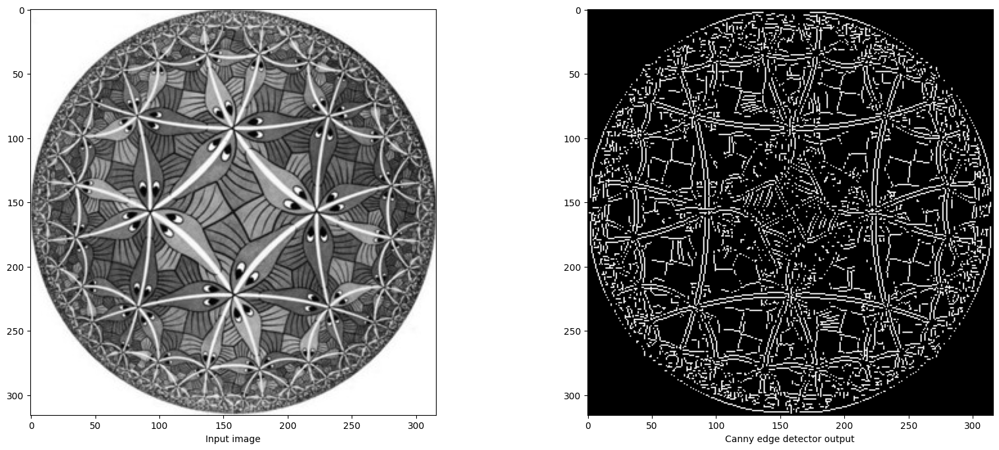

In [44]:
out_img = canny_edge_detector(img, sigma=1, low_threshold=25, high_threshold=50)

plot_pictures(
    [img, out_img],
    ["Input image", "Canny edge detector output"],
    1,
    2,
)


##### **2.4.1: Template matching**

In this section, you are going to implement a template matching algorithm. 
The goal of template matching is to find the patch in the image that is most similar to a given template. 
In this exercise, you are going to use the Canny edge detector to extract the edges of the image and the template.
Then, you will find the patch in the image that is most similar to the template. To choose the patch, you are asked to implement the *Normalized Sum of Squared Differences (NSSD)* metric:
\begin{equation}
    \mathrm{NSSD}(I_{ij}, T) = \frac{\|I_{ij} - T\|^2}{\|I_{ij}\| \cdot \|T\|}
\end{equation}

Note that $T$ denotes the template image, $I$ the target image, $I_{ij}$ a patch of $I$ at position $ij$ having the same dimensions of $T$, $I_{ij}^T$ the transpose of a $I_{ij}$.

Note also that the more $I_{ij}$ and $T$ are similar, the less the value of $\mathrm{NSSD}(I_{ij}, T)$.

More resources on template matching can be found [here](http://bias.csr.unibo.it/fei/Dispense/6%20-%20FEI%20-%20Template%20Matching.pdf) and [here](https://web.stanford.edu/class/ee368/Handouts/Lectures/2019_Winter/9-TemplateMatching.pdf).

Implement the following function that takes as input the target image $I$, and the template image $T$. The returned values are a matrix of shape `(i_height-t_heigh, i_width-t_width)` containing the metric scores at each position and the indexes $(i,j)$ of the patch in $I$ with the best metric value, as depicted below. Note that $i$ indexes along the height of $I$, $j$ indexes along the width of $I$.

```
(i,j)-------width--------+
  |                      |
  |                      |
height                   |
  |                      |
  |                      |
  +----------------------+
```

In [45]:
#Here we define an auxiliary function that returns the normalized SSD between two images
def normalized_ssd(img1: np.ndarray, img2: np.ndarray) -> float:
    """
    This function returns the normalized SSD between two images.

    Args:
        img1 (np.ndarray): first image
        img2 (np.ndarray): second image

    Returns:
        numerator / denominator (float): normalized SSD between the two images
    """
    #Here we compute the numerator and the denominator of the normalized SSD
    numerator = np.sum((img1 -img2)**2)
    denominator = np.sqrt(np.sum(img1**2))*np.sqrt(np.sum(img2**2))

    #In the special case where the denominator is 0, we return infinity since it is essentially the same
    if denominator == 0:
        return np.inf
    
    #Here we return the normalized SSD
    return numerator / denominator


def match_template(
    img: np.ndarray, template: np.ndarray
) -> Tuple[np.ndarray, Tuple[int, int]]:
    """
    This function implements the template matching algorithm.

    Args:
        img (np.ndarray): input image.
        template (np.array): template to match.

    Returns:
        img_score (np.ndarray): metric scores after applying the template matching algorithm.
        best_match_idxs (tuple): index of the best match.
    """
    #Here we define the dimensions of the template and the image
    t_height, t_width = template.shape
    i_height, i_width = img.shape

    #Here we check if the dimensions of the template are smaller than the dimensions of the image
    assert (i_height >= t_height) and (
        i_width >= t_width
    ), f"Cannot match template of shape {template.shape} with image of shape {img.shape}"

    #Here we define the metric scores after applying the template matching algorithm
    img_score = np.zeros((i_height - t_height, i_width - t_width))

    #Here we loop over chunks of the image of the same size as the template
    for i in range(i_height - t_height):
        for j in range(i_width - t_width):
            #Here we compute the normalized SSD between the template and the chunk of the image
            img_score[i, j] = normalized_ssd(
                img[i : i + t_height, j : j + t_width], template
            )

    #Finally, we obtain the indexes of the best match. We use the unravel_index function along with the argmin function to obtain the indexes of the minimum value of the metric scores
    #This is because the smaller the metric score, the better the match
    best_match_idxs = np.unravel_index(img_score.argmin(), img_score.shape)

    #Here we return the metric scores and the indexes of the best match
    return img_score, best_match_idxs


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

*Note: by running the following code, you should be able to detect the bigger fish.*

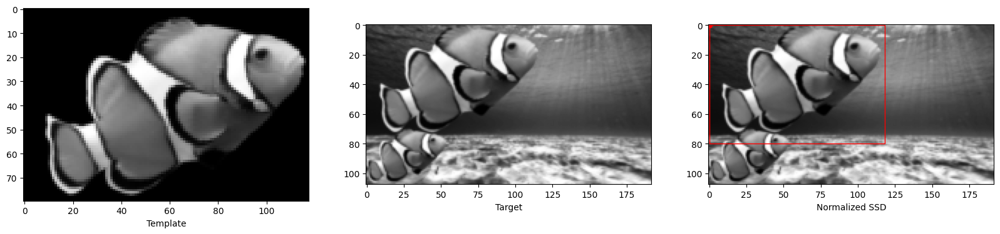

In [46]:
import matplotlib.patches as patches

img_1 = rgb2gray(np.array(Image.open("images/underwater_template.png")))
img_2 = rgb2gray(np.array(Image.open("images/underwater.png")))

template = canny_edge_detector(img_1, sigma=1, low_threshold=15, high_threshold=30)
target = canny_edge_detector(img_2, sigma=1, low_threshold=15, high_threshold=30)

img_score_nssd, best_match_nssd = match_template(target, template)

imgs = [img_1, img_2, img_2]
xlabels = ["Template", "Target", "Normalized SSD"]
axs = plot_pictures(imgs, xlabels, 1, 3, show=False, vmin=None, vmax=None)
axs[-1].plot(best_match_nssd[1], best_match_nssd[0], "ro")
axs[-1].add_patch(
    patches.Rectangle(
        (best_match_nssd[1], best_match_nssd[0]),
        template.shape[1],
        template.shape[0],
        linewidth=1,
        edgecolor="r",
        facecolor="none",
    )
)

plt.show()


Here you can look at the template and at target image side by side, after having applied the Canny edge detector.
Notice how they are different even though the parameters of the Canny edge detector are the same: this is due to the images not having the same background.

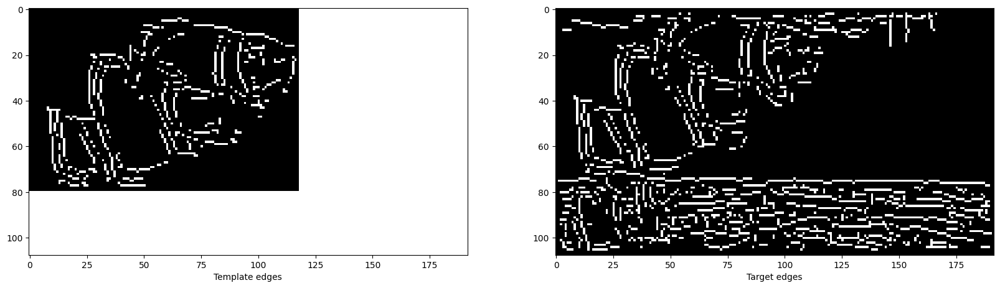

In [47]:
imgs = [template, target]
xlabels = ["Template edges", "Target edges"]
plot_pictures(imgs, xlabels, 1, 2, show=True, cmap="gray", same_scale=True)


#### **Question: 2.5 Gaussian Pyramid and Multi-Scale Template Matching** *(2/9 Points)*

Now let's implement a multi-scale object detection algorithm with Gaussian pyramid and template matching.

**Gaussian Pyramid**

Implement a Gaussian Pyramid:
- Write a function for downscaling (you can use [`skimage.transform.resize`](https://scikit-image.org/docs/stable/api/skimage.transform.html#skimage.transform.resize))
- Write a function for the Gaussian Pyramid consisting of the following steps:
  1. Downscale the image by the input factor.
  2. Apply Gaussian filter on the Image to obtain a smoothed image.
  <!-- 3. **Apply Laplacian filter** on the smoothed image to obtain edges (you can use [`scipy.ndimage.laplace`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.laplace.html)) -->
  4. Plot the 3 images side by side.
  5. Repeat previous steps with the resized smoothed version of the image

<!-- See figure below for an illlustration of Gaussian Pyramid.
![](https://drive.google.com/uc?export=view&id=14RNWwnyg-yS1FUPLCuj2bpxrluKkgjBx) -->

In [48]:
def downscale(img: np.ndarray, factor: float) -> np.ndarray:
    """
    Downscale the input image by the given factor.

    Args:
        img (np.ndarray): Input image.
        factor (float): Resizing factor.

    Returns:
        resized_img (np.ndarray): Resized image.
    """
    #Here we use the resize function from skimage.transform to downscale the image by a factor
    resized_img = resize(img, (int(img.shape[0] * factor), int(img.shape[1] * factor)))

    #Here we return the resized image
    return resized_img


In [49]:
def GaussianPyramid(img, steps=3, factor=0.5, sigma=4):
    """
    This function implements the Gaussian Pyramid and shows the results.
    Leverage the "downscale" function.

    Inputs:
        img: the image
        steps: number of steps for the Pyramid
        factor: the scaling factor to resize the image at each step
        sigma: the Gaussian filter parameter

    Outputs:
        downscale_l: list of downscale images
        blur_l: list of blurred images
    """
    
    #Here we define the lists of downscale images and blurred images
    downscale_l = []
    blur_l = []

    #Here we loop over the number of steps
    for i in range(steps):
        #First, we apply the Gaussian filter to smooth the image
        blurred_image = gaussfiltering(img, sigma)
        #Then, we downscale the image
        downscaled_image = downscale(blurred_image, factor)
        
        #Finally, we append the downscale image and the blurred image to the lists
        downscale_l.append(downscaled_image)
        blur_l.append(blurred_image)

        #Here we update the image
        img = downscaled_image
    
    #Here we return the lists of downscale images and blurred images
    return downscale_l, blur_l


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

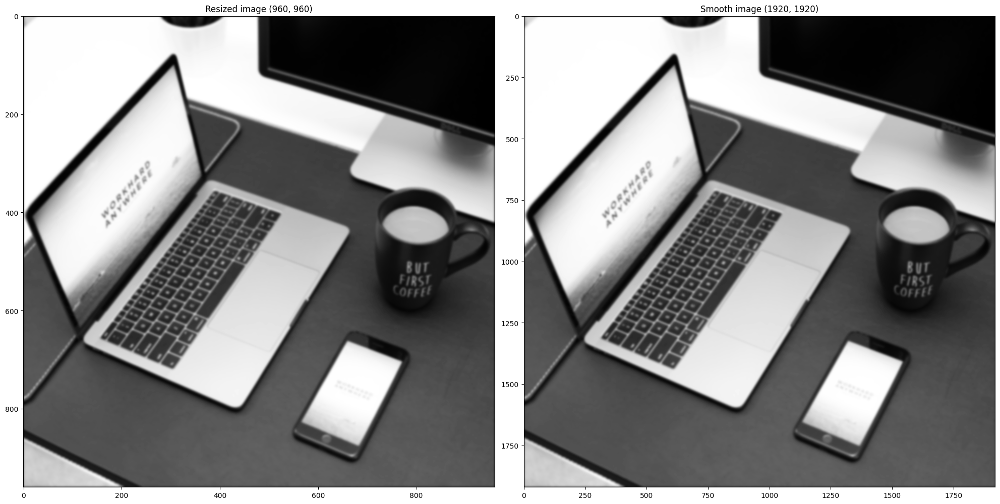

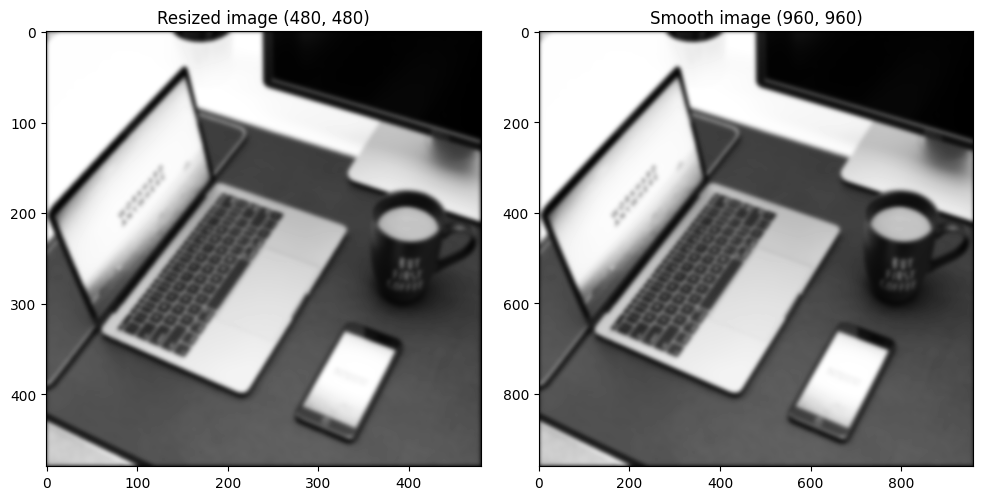

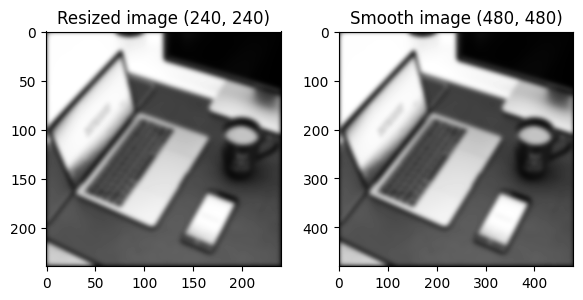

In [50]:
img = rgb2gray(np.array(Image.open("images/coffee.jpg")))
downscale_l, blur_l = GaussianPyramid(img, steps=3, factor=0.5, sigma=4)

for i in range(len(downscale_l)):
    fig, axes = plt.subplots(1, 2, figsize=(20 // (i + 1), 10 // (i + 1)))
    plt.gray()
    fig.tight_layout()
    axes[0].imshow(downscale_l[i])
    axes[0].set_title(f"Resized image {downscale_l[i].shape}")
    axes[1].imshow(blur_l[i])
    axes[1].set_title(f"Smooth image {blur_l[i].shape}")
    plt.show()


**Multi-Scale Object Detection**

Write a multi-scale object detection algorithm using the Gaussian Pyramid and the template matching algorithm you have implemented in the previous exercise.

You should expect an output image like that

![](./images/multi_scale_template_match.png)

In [51]:
def multi_scale_match_template(
    img: np.ndarray,
    template: np.ndarray,
    steps: int,
    factor: float,
    sigmas: List[float],
    low_thresholds: List[int],
    high_thresholds: List[int],
) -> List[Dict[str, Union[np.ndarray, Tuple[int, int]]]]:
    """
    This function implements the multi-scale template matching.

    Args:
        img (np.ndarray): input image.
        template (np.ndarray): template image.
        steps (int): number of steps for the Pyramid.
        factor (float): the scaling factor to resize the image at each step.
        sigmas (List[float]): the Gaussian filter parameter.
        low_thresholds (List[int]): low thresholds.
        high_thresholds (List[int]): high thresholds.

    Returns:
        out (list): list of dictionaries containing:
            img_score (np.ndarray): score image.
            result (tuple): best match coordinates.
            template (np.ndarray): template image.
    """
    #Here we define out, the list of dictionaries containing the img_score, the result and the template
    out = []

    #First we apply the Gaussian Pyramid to the template in order to obtain the downscale images and therefore find smaller fish
    downscale_l, _ = GaussianPyramid(template, steps, factor)

    #Then, we apply the Canny edge detector to the input image to highlight the edges
    target = canny_edge_detector(img, sigma=sigmas[0], low_threshold=low_thresholds[0], high_threshold=high_thresholds[0])
    
    #Here we loop over the template and its downscale images
    for i, im in enumerate([template] + downscale_l):
        #First, we apply the Canny edge detector to the template and its downscale images to highlight the edges
        template = canny_edge_detector(im, sigma=sigmas[i], low_threshold=low_thresholds[i], high_threshold=high_thresholds[i])
        #Then, we apply the template matching algorithm to the input image and the template
        img_score, best_match_idxs = match_template(target, template)
        #Then, we obtain the best match coordinates
        result = best_match_idxs

        #Finally, we append the img_score, the result and the template to the list of dictionaries
        out.append({"img_score": img_score, "result": result, "template": template})

    #Here we return the list of dictionaries
    return out


_____________________________________________________
**Do not write below this line just run it**
_____________________________________________________



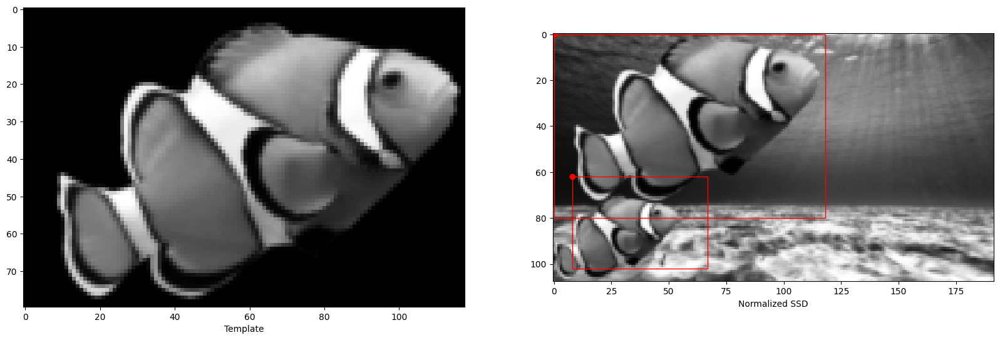

In [52]:
img1 = rgb2gray(np.array(Image.open("images/underwater.png")))
img2 = rgb2gray(np.array(Image.open("images/underwater_template.png")))

sigmas = [0.5, 0]
low_thresholds = [50, 0]
high_thresholds = [100, 10]

znssd = multi_scale_match_template(
    img=img1,
    template=img2,
    steps=1,
    factor=0.5,
    sigmas=sigmas,
    low_thresholds=low_thresholds,
    high_thresholds=high_thresholds,
)


imgs = [img2, img1]
xlabels = [
    "Template",
    "Normalized SSD",
]
axs = plot_pictures(imgs, xlabels, 1, 2, show=False, vmin=None, vmax=None)

for d in znssd:
    axs[-1].plot(d["result"][1], d["result"][0], "ro")
    axs[-1].add_patch(
        patches.Rectangle(
            (d["result"][1], d["result"][0]),
            d["template"].shape[1],
            d["template"].shape[0],
            linewidth=1,
            edgecolor="r",
            facecolor="none",
        )
    )


plt.show()


## **Question 3: Object Identification** *(12 Points)*

*Note: This identification part contains **query and model images** for the evaluation, which correspond to the same set of objects photographed from different viewpoints. The files **model.txt** and **query.txt** contain lists of image files arranged so that i-th model image depicts the same object as i-th query image.*

#### **Question 3.1: 3D Joint Color Histogram** *(2/12 Points)*

Your task is to implement a Python function, histogramdd, from scratch. This function should compute the multidimensional histogram of a given image. The function should accept an image and a specification for the number of bins to use for each dimension. You should then divide the data into bins and count the number of data points that fall into each bin. 

If you want to check that your result is correct, you can compare it with the [function already implemented by NumPy](https://numpy.org/doc/stable/reference/generated/numpy.histogramdd.html).

In [53]:

def histogramdd(img: np.ndarray, bins: int = 10) -> Tuple[np.ndarray, np.ndarray]:
    """
    Follow these steps:
        1) Create bin intervals for each dimension.
        2) Compute the shape of the histogram based on bin intervals.
        3) Initialize the histogram as an array of zeros.
        4) Compute the histogram for the input data.

    Args:
        img (np.ndarray): Input image.
        bins (int): Number of bins.

    Returns:
        histograms (np.ndarray): Histogram.
        bin_edges (np.ndarray): Bin edges.
    """

    # 1) Create bin intervals for each dimension.
    #Here we define the dimensions of the image
    N, D = img.shape
    #Here we initialize the bin intervals
    bin_intervals = []
    #Here we loop over the dimensions of the image
    for i in range(D):
        #For every dimension, we create the bin intervals using the linspace function from numpy, which returns evenly spaced numbers over a specified interval
        #This interval is defined by the minimum and maximum values of the pixels in the image and its spaced into bins + 1 intervals
        bin_intervals.append(np.linspace(np.min(img[:, i]), np.max(img[:, i]), bins + 1))

    # 2) Compute the shape of the histogram based on bin intervals.
    #Here we compute the shape of the histogram based on the bin intervals. This tuple contains the number of bins for each dimension
    shape = tuple(len(interval) - 1 for interval in bin_intervals)

    # 3) Initialize the histogram as an array of zeros.
    histograms = np.zeros(shape)

    # 4) Compute the histogram for the input data.
    #Here we loop over the pixels of the image
    for data_point in img:
        #For every pixel, we compute the bin indices using the digitize function from numpy, which returns the indices of the bins to which each value in input array belongs
        #We subtract 1 to the indices because the bin intervals are defined by the minimum and maximum values of the pixels in the image and its spaced into bins + 1 intervals
        #Therefore, the bin indices are between 1 and bins + 1, but we need them to be between 0 and bins
        #The np.clip function is used to clip (limit) the values in an array between a minimum and maximum value
        bin_indices = tuple(
            np.clip(np.digitize(data_point[i], bin_intervals[i]) - 1, 0, bins - 1)
            for i in range(D)
        )
        #Once we have the bin indices, we add 1 to the corresponding bin in the histogram
        histograms[bin_indices] += 1
   
    #Here we return the histogram and the bin edges
    return histograms, bin_intervals


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

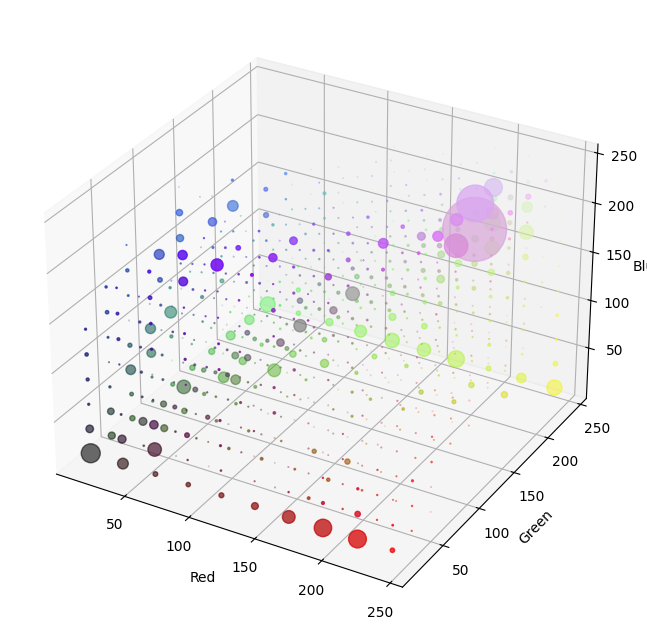

In [54]:
def histogram3dplot(h, e, fig=None):
    """
    Visualize a 3D histogram

    Parameters
    ----------

    h: histogram array of shape (M,N,O)
    e: list of bin edge arrays (for R, G and B)
    """
    M, N, O = h.shape  # numero di bins
    idxR = np.arange(M)
    idxG = np.arange(N)
    idxB = np.arange(O)

    R, G, B = np.meshgrid(idxR, idxG, idxB)  # divisione per bins
    a = np.diff(e[0])[0]
    b = a / 2
    R = a * R + b

    a = np.diff(e[1])[0]
    b = a / 2
    G = a * G + b

    a = np.diff(e[2])[0]
    b = a / 2
    B = a * B + b

    colors = np.vstack((R.flatten(), G.flatten(), B.flatten())).T / 255
    h = h / np.sum(h)
    if fig is not None:
        f = plt.figure(fig)
    else:
        f = plt.gcf()
    ax = f.add_subplot(111, projection="3d")
    mxbins = np.array([M, N, O]).max()
    ax.scatter(
        R.flatten(),
        G.flatten(),
        B.flatten(),
        s=h.flatten() * (256 / mxbins) ** 3 / 2,
        c=colors,
    )

    ax.set_xlabel("Red")
    ax.set_ylabel("Green")
    ax.set_zlabel("Blue")


img = Image.open("images/colors.jpg")
img = np.array(img)
h, e = histogramdd(img.reshape(-1, 3), bins=10)
histogram3dplot(h, e)


#### **Question: 3.2: Types of Histograms** *(2/12 Points)*

In this section, you are asked to implement the **GB** histogram and to correct the dx/dy histogram. Finally, you are asked to comment and compare the results. 

##### **GB Histogram**

In this exercise, you should implement the **GB** histogram.

*Note: as before, when considering GB, you should keep in mind that the range of the pixel's intensity is between $0$ and $255$*.

In [55]:
def gb_hist(img_color_double: np.ndarray, num_bins: int = 5) -> np.ndarray:
    """
    Compute the *joint* histogram for the G and B color channels in the image.
    The histogram should be normalized so that sum of all values equals 1,
    assume that values in each channel vary between 0 and 255

    Args:
        img_color_double (np.ndarray): Input color image.
        num_bins (int): Number of bins used to discretize each channel, total number of bins in the histogram should be num_bins^2.

    Returns:
        hists (np.ndarray): Joint histogram.

    E.g. hists[0,9] contains the number of image_color pixels such that:
        - their G values fall in bin 0
        - their B values fall in bin 9
    """

    #Here we take out the R channel from the image
    img_color_double= img_color_double[:, :, 1:]


    # Here we take the values from the G and B channels
    #We use the np.clip function to clip (limit) the values in an array between a minimum and maximum value. In this case, we clip the values between 0 and 255
    img_b = np.clip(img_color_double[:, :, 0].flatten(), 0, 255)
    img_g = np.clip(img_color_double[:, :, 1].flatten(), 0, 255)

    #Here we compute the bin indices for the G and B channels
    #We use the np.clip function to clip (limit) the values in an array between a minimum and maximum value. In this case, we clip the values between 0 and num_bins - 1
    #The np.floor function returns the floor of the input, element-wise. In this case, we floor the values of the G and B channels multiplied by the number of bins divided by 255. This is because the values of the G and B channels vary between 0 and 255
    bin_b = np.clip(np.floor(img_b*num_bins / 255).astype(int),0, num_bins - 1)
    bin_g = np.clip(np.floor(img_g*num_bins / 255).astype(int),0, num_bins - 1)

    #Here we initialize the histogram
    hists = np.zeros((num_bins, num_bins))

    #Here we loop over the values of the G and B channels
    for i in range(bin_b.size):
        #For every value, we add 1 to the corresponding bin in the histogram
        hists[bin_b[i], bin_g[i]] += 1

    #Here we flatten the histogram
    hists = hists.flatten()

    #Here we return the normalized histogram
    return hists /np.sum(hists)



The Canny edge detection algorithm is composed of 5 steps:

1. Noise reduction: apply Gaussian filter to smooth the image in order to remove the noise
2. Gradient calculation: find the intensity gradients of the image
3. Non-maximum suppression: apply gradient magnitude thresholding or lower bound cut-off suppression to get rid of spurious response to edge detection
4. Double threshold: apply double threshold to determine potential edges
5. Edge Tracking by Hysteresis: track edge by hysteresis: finalize the detection of edges by suppressing all the other edges that are weak and not connected to strong edges.


You can learn more about the Canny edge detector at the following links:
- [Canny Edge Detection](https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html).
- [Canny Edge Detection Step by Step in Python — Computer Vision](https://towardsdatascience.com/canny-edge-detection-step-by-step-in-python-computer-vision-b49c3a2d8123).
- [What is a Canny Edge Detection Algorithm?](https://towardsai.net/p/computer-vision/what-is-a-canny-edge-detection-algorithm).

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

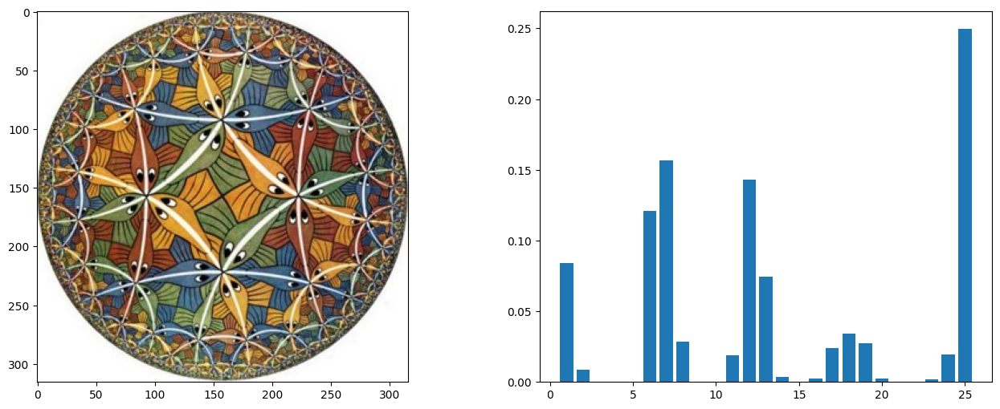

In [56]:
# Compose and test GB histograms (histogram_module.GB_hist)
img_color = np.array(Image.open("images/escher_circle.jpg"))

plt.figure(3, figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.imshow(img_color)

num_bins_color = 5
plt.subplot(1, 2, 2)
hist_gb = gb_hist(img_color.astype("double"), num_bins_color)
plt.bar(np.array(range(1, hist_gb.size + 1)), hist_gb)
plt.show()


##### **DX/DY Histogram**

In this exercise, you will find an implemented version of another type of histogram, the dx/dy one. However, **it is not correct, there are some mistakes in the code**:

- function `gaussdx`: **2 mistakes**;
- function `gauss_dxdy`: **2 mistakes**;
- function `hist_dxdy`: **2 mistakes**.

You are asked to copy each function in the corresponding cell and to correct the mistakes. Put a comment on the lines where you have made the corrections. 
Before coding, write down the first derivative of the Gaussian function.

*HINT: leverage the result of the derivation to correct the mistakes in `gaussdx`*.

*Note: each mistaken line counts as one mistake; a mistake can also be a missing line or a missing block of lines*.

##### **Derivative of the 1D Gaussian**
-------------------------------------------------------
The 1D Gaussian is defined as follows:

\begin{equation}
G(x)=\frac{1}{\sqrt{2\pi}\sigma}\exp\left(-\frac{x^2}{2\sigma^2}\right) \tag{1}
\end{equation}

The first derivative of this function, using the chain rule is the following:

\begin{align}
\frac{dG(x)}{dx} =& \frac{d}{dx}\left(\frac{1}{\sqrt{2\pi}\sigma}\exp\left(-\frac{x^2}{2\sigma^2}\right) \right)  \quad \text{(by definition)} \nonumber\\
=& \frac{1}{\sqrt{2\pi}\sigma} \frac{d}{dx}\left(\exp\left(-\frac{x^2}{2\sigma^2}\right) \right) \quad \text{(since $\frac{d(cf(x))}{dx} = c\frac{df(x)}{dx}$)}\nonumber\\
=& \frac{1}{\sqrt{2\pi}\sigma}\exp\left(-\frac{x^2}{2\sigma^2}\right) \frac{d}{dx}\left(-\frac{x^2}{2\sigma^2} \right) \quad \text{(since $\frac{d(e^{u(x)})}{dx} = e^u(x)\frac{du(x)}{dx}$)}\nonumber\\
=& -\frac{1}{2\sigma^2} \cdot \frac{1}{\sqrt{2\pi}\sigma}\exp\left(-\frac{x^2}{2\sigma^2}\right) \frac{d}{dx}\left(x^2\right) \quad \text{(since $\frac{d(cf(x))}{dx} = c\frac{df(x)}{dx}$)}\nonumber\\
=& -\frac{2}{2\sigma^2} \cdot \frac{1}{\sqrt{2\pi}\sigma}\exp\left(-\frac{x^2}{2\sigma^2}\right) \cdot x \quad \text{(since $\frac{d(x^n)}{dx} = nx^{n-1}$)} = \boxed{-\frac{1}{\sqrt{2\pi}\sigma^3}x\exp\left(-\frac{x^2}{2\sigma^2}\right)} \tag{2}
\end{align}

-------------------------------------------------------

In [57]:
def gaussdx(sigma: float) -> Tuple[np.ndarray, np.ndarray]:
    """
    This function computes the first derivative of the 1D Gaussian operator.

    Args:
        sigma (float) : the standard deviation of the Gaussian filter

    Returns:
        Dx (np.ndarray): the first derivative of the 1D Gaussian operator
        x (np.ndarray): the indexes of the 1D Gaussian operator
    """
    #Here we apply the math.ceil function to sigma, which returns the smallest integer greater than or equal to sigma
    sigma = math.ceil(sigma)
    #Here we compute the size of the filter. We CORRECTED this line since the filter goes from -3*sigma to 3*sigma and therefore the size is 2*3*sigma + 1
    filter_size = 2*3* sigma + 1

    # Generate the index x
    zero_pos = 3 * sigma  # the (zero_pos+1)th element is the 0 for the index
    x = np.arange(filter_size) - zero_pos  # indexes from -3*sigma to 3*sigma

    # Compute the Gaussian curve with std-dev sigma at the indexes x. We CORRECTED this line since the derivative was wrong, it was missing a minus sign and a cubic power in sigma
    Dx = -x * np.exp(-(x**2.) / (2.0 * sigma**2)) / (math.sqrt(2.0 * np.pi) * sigma**3.)

    #Here we return the first derivative of the 1D Gaussian operator and the indexes of the 1D Gaussian operator
    return Dx, x


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

To check that your implementation is correct, plot the result of the function with $\sigma=3$ and compare it with the image below.

![](./images/1gaussdx.png)

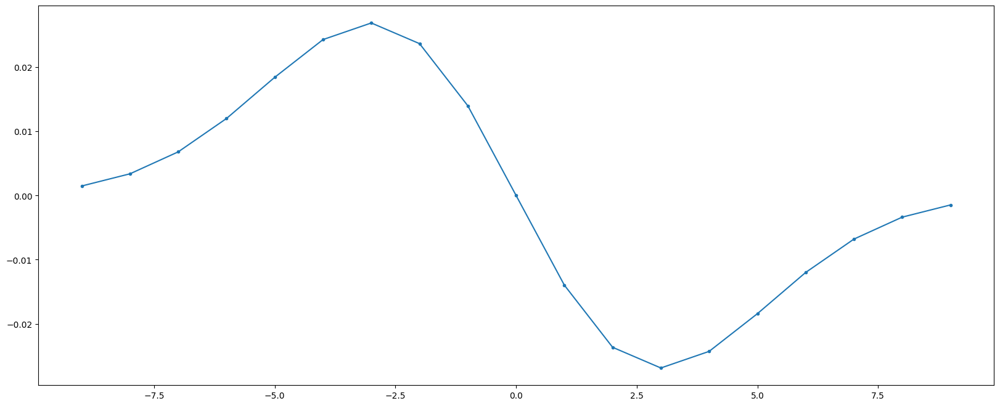

In [58]:
# plot the first derivative of the 1D Gaussian operator
sigma = 3
Dx, x = gaussdx(sigma)
plt.figure(1)
plt.plot(x, Dx, ".-")
plt.show()


_____________________________________________________

In [59]:
def gauss_dxdy(img, sigma):
    """
    This function applies the first derivative of the 1D Gaussian operator to the image in the x and y directions.

    Args:
        img: the input image
        sigma: the standard deviation of the Gaussian filter

    Returns:
        img_Dx: the image after applying the first derivative of the 1D Gaussian operator in the x direction
        img_Dy: the image after applying the first derivative of the 1D Gaussian operator in the y direction
    """

    #Here we obtain the gaussian filter and the first derivative of the gaussian filter in the x direction
    #N.B: I chose the k of this gaussian to be 1 since it is the only value that gave the same value for the dxdy histogram. If not, it is very similar but not the same
    Gx, _ = gauss(sigma, 1)
    Dx, _ = gaussdx(sigma)

    #Here we reshape the gaussian filter and the first derivative of the gaussian filter in the x direction
    Gx = Gx.reshape(1, Gx.size)
    Dx = Dx.reshape(1, Dx.size)

    #Here we apply the first derivative of the gaussian filter in the x direction to the image
    #We CORRECTED this line, because the convolution was wrong. We had to transpose the gaussian filter and the first derivative of the gaussian filter in the x direction
    img_Dx = conv2(conv2(img, Dx, 'same'), Gx.T, 'same')
    #Here we apply the first derivative of the gaussian filter in the y direction to the image
    #We CORRECTED this line, because the convolution was wrong. We had to transpose the derivative of the gaussian filter in the x direction and the gaussian filter
    img_Dy = conv2(conv2(img, Gx, 'same'), Dx.T, 'same')

    #Here we return the image after applying the first derivative of the 1D Gaussian operator in the x direction and the image after applying the first derivative of the 1D Gaussian operator in the y direction
    return img_Dx, img_Dy


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

To check that your implementation is correct, plot the result of the function with $\sigma=1$ and compare it with the images below.

![](./images/check_gaussdxdy.png)

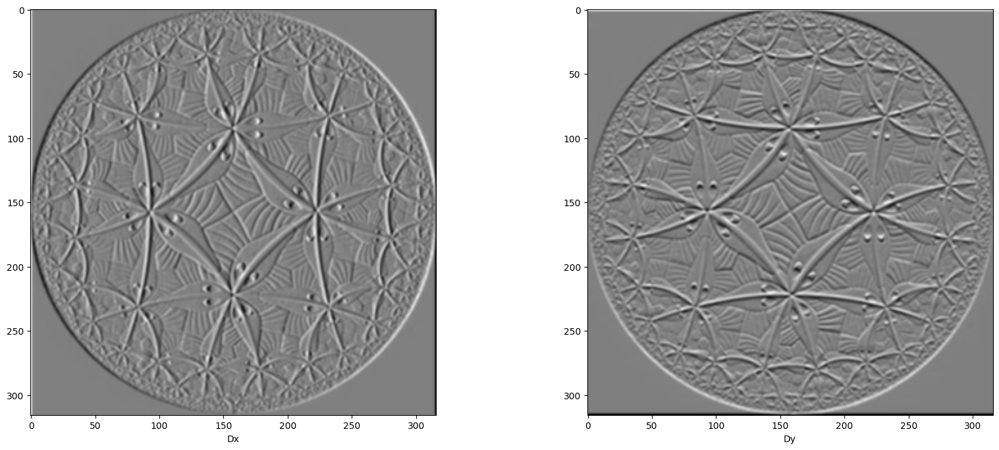

In [60]:
img_color = rgb2gray(np.array(Image.open("images/escher_circle.jpg")))

img_Dx, img_Dy = gauss_dxdy(img_color, 1)

plot_pictures([img_Dx, img_Dy], ["Dx", "Dy"], 1, 2)


--------------------------------------------

In [61]:
def hist_dxdy(img_gray, num_bins=5):
    """
    This function computes the *joint* histogram of Gaussian partial derivatives of the image in x and y direction.
    Set sigma to 3.0 and cap the range of derivative values is in the range [-6, 6].
    The histogram should be normalized so that the sum of all values equals 1.

    Args:
        img_gray: the input image
        num_bins: number of bins used to discretize each dimension, total number of bins in the histogram should be num_bins^2

    Returns:
        hists: the joint normalized histogram of Gaussian partial derivatives of the image in x and y direction
    """

    assert len(img_gray.shape) == 2, "image dimension mismatch"
    assert img_gray.dtype == "float", "incorrect image type"

    # Compute the first derivatives of img_gray
    sigma = 3.0
    img_dx, img_dy = gauss_dxdy(img_gray, sigma)

    # Set the min_der and max_der to -6 and 6, which defines the ranges for quantization
    min_der, max_der = (-6, 6)

    # Flatten the 2D derivative images to 1D arrays
    img_dx = img_dx.reshape(-1)
    img_dy = img_dy.reshape(-1)

    # Clip the min and max values to min_der and max_der respectively
    # and shift minumum values to 0
    img_dx = np.clip(img_dx, min_der, max_der) + max_der 
    img_dy = np.clip(img_dy, min_der, max_der) + max_der #We CORRECTED this line because the shifting had to be done also on the img_dy

    hists = np.zeros((num_bins, num_bins), dtype=int)
    bin_range = (max_der - min_der) / num_bins

    # quantize image derivative valuer into bins
    bin_dx = np.floor(img_dx / bin_range).astype(int)
    bin_dy = np.floor(img_dy / bin_range).astype(int)
    bin_dx = np.clip(bin_dx, 0, num_bins - 1)
    bin_dy = np.clip(bin_dy, 0, num_bins - 1)

    # compute the 2D histogram
    for i in range(bin_dx.size):
        hists[bin_dx[i], bin_dy[i]] += 1

    #We ADDED these lines since the histogram was not normalized
    hists = hists.flatten()
    hists = hists / hists.sum()

    #Here we return the joint normalized histogram of Gaussian partial derivatives of the image in x and y direction
    return hists


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

To check that your implementation is correct, compare it with the image below.

![](./images/check_hist_dxdy.png)

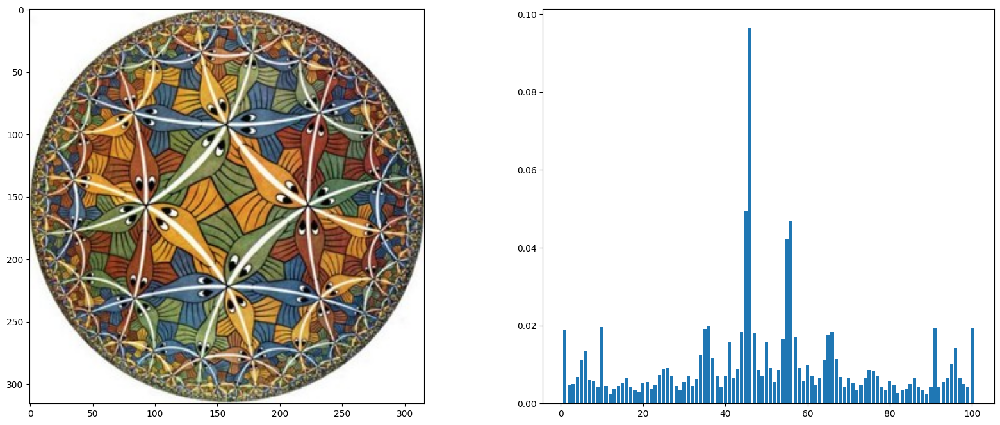

In [62]:
img_color = np.array(Image.open("images/escher_circle.jpg"))
img_gray = rgb2gray(img_color.astype("double"))

plt.figure(5)
plt.subplot(1, 2, 1)
plt.imshow(img_color)

num_bins_dxdy = 10
plt.subplot(1, 2, 2)
hist_dxdy_ = hist_dxdy(img_gray, num_bins_dxdy)
plt.bar(np.array(range(1, hist_dxdy_.size + 1)), hist_dxdy_)
plt.show()


##### **Theoretical questions**

Now that you have implemented two color histograms - 3D joint and GB - and the dx/dy histogram, answer to the following questions: 

1. What does the dx/dy histogram represent in terms of image features?
2. In your opinion, which of the two types of histograms (color and dx/dy) is more robust to changes in illumination? Why?

##### **Answers:**
-------------------------------------------------------

1. The dx/dy histogram represents image features related to the spatial gradients in an image. In the context of image processing the dx and dy derivatives capture how the intensity of an image changes as you move in the x and y directions, providing information about the direction and magnitude of changes in pixel values as you move from one pixel to another within the image. Specifically, they provide information about the image edges since the first derivatives (dx and dy) highlight edges in an image. In the dx/dy histogram you can observe how frequently different gradient orientations or magnitudes occur in the image, providing insights into the distribution of edge or texture patterns within an image.

2. The dx/dy histogram is generally more robust to changes in illumination compared to color histograms. Here's a brief explanation: The dx/dy histograms are less affected by global illumination changes because they primarily capture local variations in pixel values. Global illumination changes, such as changes in overall brightness or contrast, tend to affect all pixels uniformly and do not significantly impact the local gradient information represented in the dx/dy histogram since edges and textures are features that often remain relatively consistent under varying illumination conditions. On the other side, color histograms (like the gb) are directly affected by changes in illumination, as changes in lighting conditions can alter the color distribution in an image. For instance, shadows and highlights can lead to significant shifts in color histograms, making them less robust to illumination changes.


-------------------------------------------------------

### **Question 3.3: Histogram Metrics** *(3/12 Points)*

Now that you have implemented and used different types of histograms, let's consider distance functions.
1. Write the definition of intersection distance function, $L_2$, and $\chi^2$ distance functions.
2. Implement each one of them.
3. Write down some considerations on each one of them.

Complete the definition of each metric.
* Intersection function **for unnormalized histograms**:
\begin{equation}
\bigcap(Q,V)= \frac{1}{2}\left(
\frac{\sum_i \min(q_i,v_i)}{\sum_i q_i} +
\frac{\sum_i \min(q_i,v_i)}{\sum_i v_i}
\right)
\tag{1}
\end{equation}
* $L_2$ function:
\begin{equation}
d(Q,V)= \sqrt{\sum_i (q_i-v_i)^2}
\tag{2}
\end{equation}
* $\chi^2$ function:
\begin{equation}
\chi^2(Q,V)= \sum_i \frac{(q_i-v_i)^2}{q_i + v_i}
\tag{3}
\end{equation}

In [63]:
def hist_intersect(h1: np.ndarray, h2: np.ndarray) -> float:
    """
    Compute the intersection between histograms x and y.
    Check that the distance range is [0,1].

    Args:
        h1 (np.ndarray): Input histogram.
        h2 (np.ndarray): Input histogram.

    Returns:
        x (float): Intersection distance between histograms x and y.
    """

    #Since our histograms are normalized, we can compute the intersection between them by summing the minimum values of the histograms
    x = np.sum(np.minimum(h1, h2))

    #Here we check that the distance range is [0,1]
    assert 0 <= x <= 1, "distance range is not [0,1]"
    
    #Here we return the intersection distance between histograms x and y
    return x


def hist_l2(h1: np.ndarray, h2: np.ndarray) -> float:
    """
    Compute the L2 between x and y histograms.
    Check that the distance range in [0,sqrt(2)].

    Args:
        h1 (np.ndarray): Input histogram.
        h2 (np.ndarray): Input histogram.

    Returns:
        x (float): L2 distance between x and y histograms.
    """
    #Here we compute the L2 distance between the histograms
    x = np.sqrt(np.sum((h1-h2)**2))
    #Here we check that the distance range is [0,sqrt(2)]
    assert 0 <= x <= np.sqrt(2), "distance range is not [0,sqrt(2)]"
    #Here we return the L2 distance between x and y histograms
    return x


def hist_chi2(h1: np.ndarray, h2: np.ndarray) -> float:
    """
    Compute chi2 between x and y.
    Check that the distance range in [0,Inf].

    Args:
        h1 (np.ndarray): Input histogram.
        h2 (np.ndarray): Input histogram.

    Returns:
        x (float): Chi2 distance between x and y.
    """
    #Here we compute the chi2 distance between the histograms
    x = np.sum((h1-h2)**2 / (h1+h2+1))
    #Here we check that the distance range is [0,Inf]
    assert 0 <= x <= np.inf, "distance range is not [0,Inf]"
    #Here we return the chi2 distance between x and y
    return x


Write there your considerations about the advantages and disadvantages of each one of them, stating if each is a similarity or distance metric.

#### **Considerations:**
--------------------------------------------

* **Intersection distance function**: The intersection function is a **similarity** metric. It can't be a distance metric since one of the fundamental properties of distance metrics is that:

    \begin{equation}
    D(A,B) = 0 \Longleftrightarrow A = B
    \end{equation}

    Nevertheless, if we take the intersection of an histogram $Q$ with itself, we can easily see that $\bigcap(Q,Q)= 1$.

    One of its main advantages is that it quantifies the commonality between two histograms in a way that is easily understandable. It tells you how much of one histogram overlaps with the other. It gives higher similarity scores when there is significant overlap in the histograms. Nevertheless, a main disadvantage is that the intersection may not be very effective in distinguishing between histograms when there is minimal overlap or when the histograms represent different objects. It is primarily a measure of commonality and may not capture subtle differences well. It can also neglect spatial information since it treats all data points equally, regardless of their positions.

* **$L_2$ distance function**: The $L_2$ function is a **distance** metric since it is defined as the Euclidean distance and thus has all the properties of a distance measure.

    This measure is continuous and non-negative, as it involves summing squared differences. The result is always non-negative, and it can capture subtle differences between histograms. One of its main advantages is that it is sensitive to both the direction and magnitude of differences between histograms. It penalizes large differences more than small ones. Nevertheless, all the cells are weighted equally, and for example, it can treat histograms with the same shape but different starting points as dissimilar. Also, it is a measure sensitive to outliers, since extreme values in either histogram can dominate the distance measure.

* **$\chi^2$ distance function** : The $\chi^2$ function is a **distance** metric since satisfies all the properties of a distance measure (non-negativity, symmetry, $D(A,B) = 0 \Longleftrightarrow A = B$, and the triangle inequality). In this case, the $\chi^2$ doesn't weight every cell equally, so it captures not only the overall differences but also highlights local differences between bins. This makes it effective in identifying where the histograms diverge the most. One disadvantage is that distance can be sensitive to small values in the bins, particularly when both are close to zero. In such cases, the division by small values can lead to disproportionately high differences.

--------------------------------------------

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

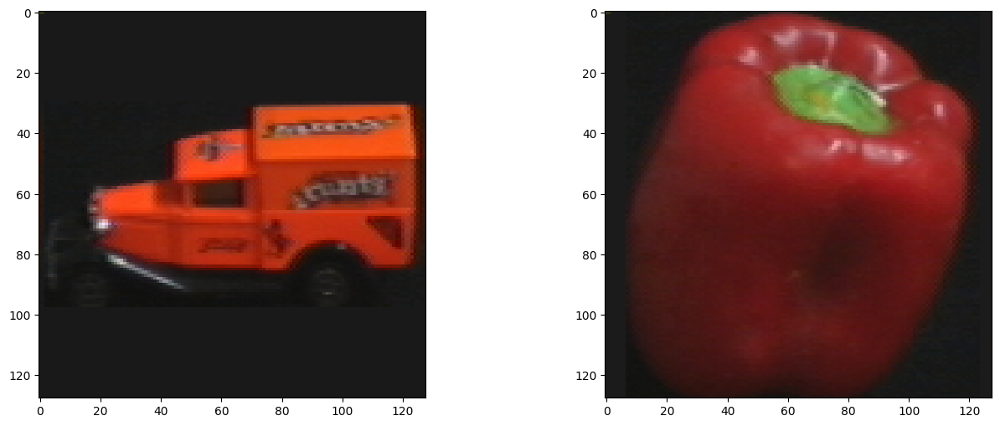

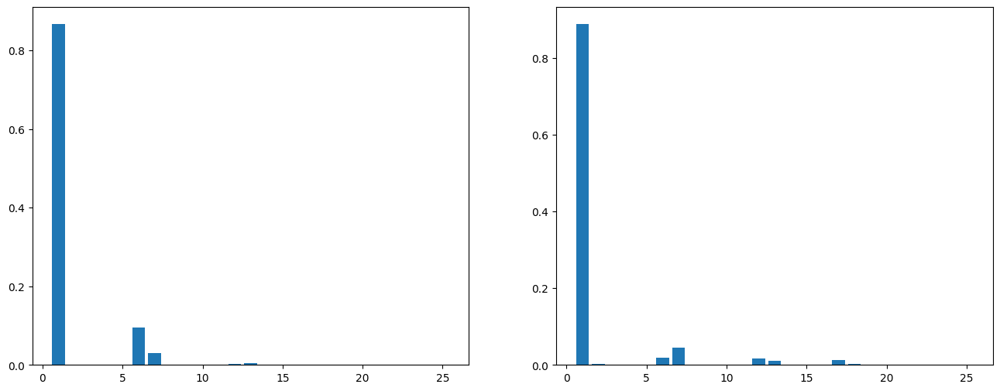

Intersection:
	0.92279052734375	0.92279052734375
L2:
	0.08391736928335677	0.08391736928335677
Chi2:
	0.006107372883401606	0.006107372883401605


In [64]:
img1 = np.array(Image.open("model/obj100__0.png"))
img2 = np.array(Image.open("model/obj63__0.png"))

num_bins_color = 5
hist1 = gb_hist(img1.astype("double"), num_bins_color)
hist2 = gb_hist(img2.astype("double"), num_bins_color)

# plot images and histograms
plt.figure(6, figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.show()

plt.figure(7, figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.bar(np.array(range(1, hist1.size + 1)), hist1)
plt.subplot(1, 2, 2)
plt.bar(np.array(range(1, hist2.size + 1)), hist2)
plt.show()

metrics = np.array(
    [hist_intersect(hist1, hist2), hist_l2(hist1, hist2), hist_chi2(hist1, hist2)]
)

# write distances to file
# np.savetxt("assets/metrics.npy", metrics)

# read metrics from file
metrics = np.loadtxt("assets/metrics.npy")

# print distances and compare them with the solution
print(f"Intersection:\n\t{metrics[0]}\t{hist_intersect(hist1, hist2)}")
print(f"L2:\n\t{metrics[1]}\t{hist_l2(hist1, hist2)}")
print(f"Chi2:\n\t{metrics[2]}\t{hist_chi2(hist1, hist2)}")


### **Question 3.4: Image Retrieval** *(3/12 Points)*

Now that you have implemented and used different types of histograms, it's time to test how suitable they are for retrieving images in a query-by-example scenario.

Implement a function called `find_best_match` that returns the closest model images for each query image.
The function takes input string parameters, identifying the distance function, histogram function, and the number of histogram bins.

*Note: See comments at the beginning of the `find_best_match` function for more details.*

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

In [65]:
def is_grayvalue_hist(hist_name: str) -> bool:
    """
    Handle function to discriminate when your input
    function is in gray_scale or colors.

    Args:
        hist_name (str): histogram name.

    Returns:
        bool: True if the histogram is in gray_scale, False otherwise.
    """
    if hist_name == "grayvalue" or hist_name == "dxdy":
        return True
    elif hist_name == "rgb" or hist_name == "gb":
        return False
    else:
        assert False, "unknown histogram type"


def get_hist_by_name(img: np.ndarray, num_bins_gray: int, hist_name: str) -> np.ndarray:
    """
    Handle function to get the correct historgam function
    by his name.

    Args:
        img (np.ndarray): input image.
        num_bins_gray (int): number of bins for the gray_scale histogram.

    Returns:
        np.ndarray: histogram.
    """
    # if hist_name == "rgb":
    #     return rgb_hist(img, num_bins_gray)
    if hist_name == "gb":
        return gb_hist(img, num_bins_gray)
    elif hist_name == "dxdy":
        return hist_dxdy(img, num_bins_gray)
    else:
        assert False, "unknown hist type: %s" % hist_name


def get_dist_by_name(x: np.ndarray, y: np.ndarray, dist_name: str) -> float:
    """
    Handle function to get the correct distance function
    by his name.

    Args:
        x (np.ndarray): input histogram.
        y (np.ndarray): input histogram.

    Returns:
        float: distance.
    """
    if dist_name == "chi2":
        return hist_chi2(x, y)
    elif dist_name == "intersect":
        return 1 - hist_intersect(x, y)
    elif dist_name == "l2":
        return hist_l2(x, y)
    elif dist_name == "all":
        pass
    else:
        assert False, "unknown distance: %s" % dist_name


def read_files(
    model_path: str = "assets/model.txt", query_path: str = "assets/query.txt"
) -> Tuple[List[str], List[str]]:
    """
    Handle function to read query and model files.

    Args:
        model_path (str): path to the model file.
        query_path (str): path to the query file.

    Returns:
        Tuple[List[str], List[str]]: query images and model images.
    """
    with open(model_path) as fp:
        model_images = fp.readlines()
    model_images = [x.strip() for x in model_images]

    with open(query_path) as fp:
        query_images = fp.readlines()
    query_images = [x.strip() for x in query_images]

    return query_images, model_images


In [66]:
# note: use functions 'get_dist_by_name', 'get_hist_by_name' and 'is_grayvalue_hist' to obtain
#       handles to distance and histogram functions, and to find out whether histogram function
#       expects grayvalue or color image


def compute_histograms(
    image_list: List[np.ndarray], hist_type: str, hist_isgray: bool, num_bins: int
) -> List[np.ndarray]:
    """
    Compute the histogram for each image in image_list.

    Args:
        image_list (List[np.ndarray]): list of images.
        hist_type (str): histogram type.
        hist_isgray (bool): True if the histogram is in gray_scale, False otherwise.
        num_bins (int): number of bins for the gray_scale histogram.

    Returns:
        image_hist (List[np.ndarray]): list of histograms.
    """
    #Here we initialize the list of histograms
    image_hist = []
    #Here we loop over the images
    for img in image_list:
        #If the histogram requires a gray_scale image, we convert the image to gray_scale
        if hist_isgray:
            img = rgb2gray(img.astype("double"))
        
        #Here we compute the histogram of the image
        image_hist.append(get_hist_by_name(img, num_bins, hist_type))

    #Here we return the list of histograms
    return image_hist


def find_best_match(
    model_images: List[str],
    query_images: List[str],
    dist_type: str,
    hist_type: str,
    num_bins: int,
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Function to find the best match for each image in the
    query folder.

    Args:
        model_images (List[str]): list of strings with the path of model images.
        query_images (List[str]): list of strings with the path of query images.
        dist_type (str): a string to represent the name of the distance you want to use. Should be one among "l2", "intersect", "chi2".
        hist_type (str): a string to represent the name of the histogram you want to use. Should be one among "grayvalue", "rgb", "rg", "dxdy".
        num_bins (int): number of bins for the gray_scale histogram.

    Returns:
        best_match (np.ndarray): list containing in each position the index of the retrieved best matching image.
        D (np.ndarray): Matrix with |model_images| rows and |query_images| columns containing the scores of each matching.
    #"""
    #Here we read the query and model files and we obtain the query and model images as numpy arrays
    query_arrays = [np.array(Image.open(query_image_string)).astype("double") for query_image_string in query_images]
    model_arrays = [np.array(Image.open(model_image_string)).astype("double") for model_image_string in model_images]

    #Here we compute the histograms of the query and model images
    query_hists = compute_histograms(query_arrays, hist_type, is_grayvalue_hist(hist_type), num_bins)
    model_hists = compute_histograms(model_arrays, hist_type, is_grayvalue_hist(hist_type), num_bins)

    #Here we initialize the matrix D of scores
    D = np.zeros((len(query_hists), len(model_hists)))
    
    #Here we loop over the query and model histograms
    for i in range(len(query_hists)):
        for j in range(len(model_hists)):
            #For every pair of query and model histograms, we compute the distance between them
            D[i, j] = get_dist_by_name(query_hists[i], model_hists[j], dist_type)

    #Here we obtain the best match for each query image
    best_match = np.argmin(D, axis=1)

    #Here we return the best match and the matrix of scores
    return best_match, D


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

In [67]:
# model_images - list of file names of model images
# query_images - list of file names of query images

query_images, model_images = read_files()

dist_type = "intersect"
hist_type = "gb"
num_bins = 10

[best_match, D] = find_best_match(
    model_images, query_images, dist_type, hist_type, num_bins
)

print(
    "Indexes of correct retrieved images is:\n ",
    *np.where(best_match == np.arange(len(query_images)))
)
print(
    "The Recognition rate is",
    sum(best_match == np.arange(len(query_images))) / len(query_images),
)


Indexes of correct retrieved images is:
  [ 0  1  2  3  6  8  9 10 11 12 13 14 16 17 18 19 21 23 24 26 28 29 30 32
 33 36 37 38 42 43 44 45 46 48 49 50 51 52 54 55 57 58 59 60 64 66 69 70
 71 74 75 77 78 80 81 82 83 84 85 86 87 88]
The Recognition rate is 0.6966292134831461


### **#2 Report** *(2/12 Points)*

Experiment with different functions and numbers of histogram bins, and find a combination that works best. **Submit the summary of your experiments in a report as part of your solution.**

#### **Summary:** 
----------------------------

In order to visualize better how the accuracy changes with respect to the number of bins, we developed a code that helps us plot each accuracy value for each number of bins for every distance measure. This code also provides us with the maximum accuracy values for each pair of distance measure and number of bins. Please run the following cell:


In [68]:
def accuracy_by_histogram(hist_type : str, bins_inferior_limit : int, bins_upper_limit: int) -> Dict[str, List[float]]:
    """
    Function that computes the accuracies for different histogram types and different number of bins.

    Args:
        hist_type (str): a string to represent the name of the histogram you want to use. Should be one among "gb" and "dxdy".
        bins_inferior_limit (int): inferior limit of the number of bins.
        bins_upper_limit (int): upper limit of the number of bins.

    Returns:
        results_dict (Dict[str, List[float]]): dictionary containing the accuracies for each distance type and each number of bins for the given histogram type.
    """
    
    #Here we define the different types of distance
    types_of_distance = ["intersect", "l2", "chi2"]
    #Here we build a range of number of bins
    number_of_bins = np.arange(bins_inferior_limit, bins_upper_limit+1)

    #Here we read the files
    query_images, model_images = read_files()

    #Here we initialize the dictionary that will contain the results
    results_dict = {}

    #For every distance type we compute the best match and the accuracy for each number of bins
    for dist_type in types_of_distance:
        #Here we initialize the list that will contain the accuracies
        accuracy_list = []
        #For every number of bins we compute the best match and the accuracy
        for num_bins in number_of_bins:
            #Here we compute the best match and the accuracy
            [best_match, D] = find_best_match(
                model_images, query_images, dist_type, hist_type, num_bins
            )
            accuracy = sum(best_match == np.arange(len(query_images))) / len(query_images)
            #Here we append the accuracy to the list for the given distance type and number of bins
            accuracy_list.append(accuracy)
        
        #Here we append the list of accuracies to the dictionary for the given distance type
        results_dict[dist_type] = accuracy_list
    
    #Here we return the dictionary and the number of bins
    return number_of_bins, results_dict


If we plot the accuracy values for number of bins ranging from 1 to 50 (for the gb histogram) we can observe the following plot:

The best accuracy for gb histogram and intersect distance is 0.8426966292134831 and it is obtained with 32 bins
The best accuracy for gb histogram and l2 distance is 0.6292134831460674 and it is obtained with 12 bins
The best accuracy for gb histogram and chi2 distance is 0.6741573033707865 and it is obtained with 11 bins


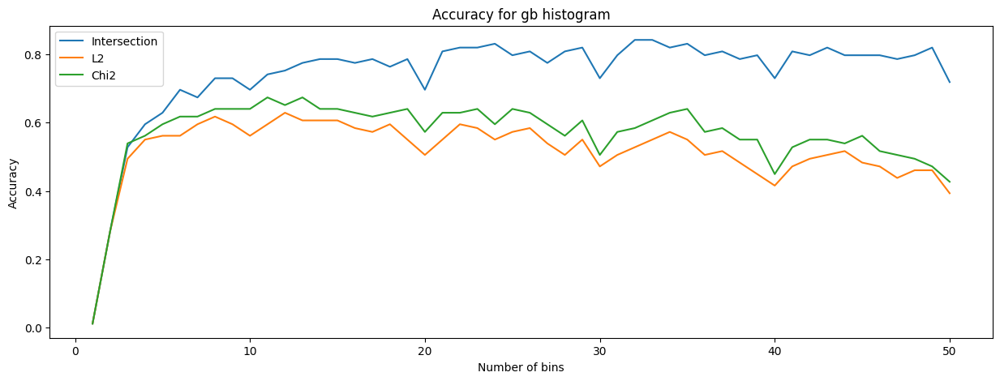

In [70]:
#Here we define the histogram type
hist_type = "gb"

#Here we plot the results
plt.figure(figsize=(15, 5))

#Here we compute the accuracies for the given histogram type and plot them
number_of_bins, results_dict = accuracy_by_histogram(hist_type, 1, 50)

#Here we plot the results
plt.plot(number_of_bins, results_dict["intersect"], label="Intersection")
plt.plot(number_of_bins, results_dict["l2"], label="L2")
plt.plot(number_of_bins, results_dict["chi2"], label="Chi2")

#Here we plot features of the plot
plt.xlabel("Number of bins")
plt.ylabel("Accuracy")
plt.legend()
plt.title(f"Accuracy for {hist_type} histogram")

#Finally, we print the best accuracy for each distance type and the number of bins that gives it
for dist_type in results_dict.keys():
    print(f"The best accuracy for {hist_type} histogram and {dist_type} distance is {max(results_dict[dist_type])} and it is obtained with {number_of_bins[np.argmax(results_dict[dist_type])]} bins")


We can observe that for the gb histogram we achieved a maximum accuracy with the intersection measure, being the highest with number of bins equal to 32. As an overall behaviour we can see that the accuracy increases with the number of bins until it "stabilizes" and varies around a given value. For the $L_{2}$ and $\chi^2$ measures, we can see that the accuracy steadily decreases after achieving its maximum given that this measures are more sensitive to small values in the bins.

We could do the same plot for the dxdy histogram:

The best accuracy for dxdy histogram and intersect distance is 0.6741573033707865 and it is obtained with 17 bins
The best accuracy for dxdy histogram and l2 distance is 0.48314606741573035 and it is obtained with 9 bins
The best accuracy for dxdy histogram and chi2 distance is 0.5168539325842697 and it is obtained with 9 bins


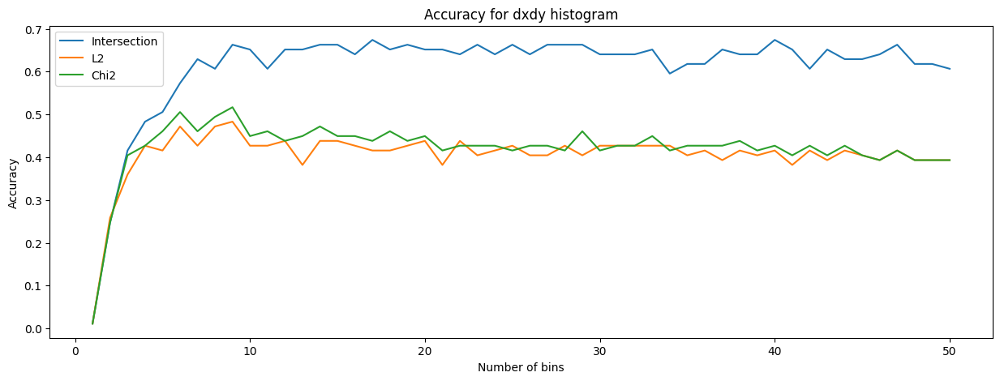

In [71]:
#Here we define the histogram type
hist_type = "dxdy"

#Here we plot the results
plt.figure(figsize=(15, 5))

#Here we compute the accuracies for the given histogram type and plot them
number_of_bins, results_dict = accuracy_by_histogram(hist_type, 1, 50)

#Here we plot the results
plt.plot(number_of_bins, results_dict["intersect"], label="Intersection")
plt.plot(number_of_bins, results_dict["l2"], label="L2")
plt.plot(number_of_bins, results_dict["chi2"], label="Chi2")

#Here we plot features of the plot
plt.xlabel("Number of bins")
plt.ylabel("Accuracy")
plt.legend()
plt.title(f"Accuracy for {hist_type} histogram")

#Finally, we print the best accuracy for each distance type and the number of bins that gives it
for dist_type in results_dict.keys():
    print(f"The best accuracy for {hist_type} histogram and {dist_type} distance is {max(results_dict[dist_type])} and it is obtained with {number_of_bins[np.argmax(results_dict[dist_type])]} bins")


In this case we can see that the accuracies are lower than with the gb histogram, which makes us think that for the images we are analyzing it is more important the distribution of color than the edges or details on the images. As in the previous case, we can observe that the intersection distance is the measure that gives better accuracy with respect to the other two.

**Top 3 Summary Table (GB Histogram case):**

----------------------------


|  | Number of Bins | Metric(Distance Metric) | Accuracy |
|---|---|---|---|
| 1 | 32 | intersection | 0.842 |
| 2 | 11 | $\chi^2$ | 0.674 |
| 3 | 12 | $l_{2}$ | 0.629 |

## ***Bonus* Question 4: Performance Evaluation** *(5 Points)*

In this bonus question, your goal is to implement different types of metrics to evaluate the performance of a binary classificator.

For the purpose of this exercise you don't need to know the inner workings of the ML model, therefore imagine to have a black box model that estimates the probability of an event occurring, such as the sky being clear or not, based on a given dataset of independent variables. Since the outcome is a probability, the dependent variable is bounded between 0 and 1.

In order to compute a performance score (e.g., accuracy), you need to compare your predictions with the true values. So you need to convert the predicted probabilities into 0s and 1s by means of a threshold.

What you have to do is the following:
- **compute the performance** of the model with all the possible tresholds in the interval \[0.0, 1.0\] with increments of 0.5
- **analyze** how the metrics vary at different thresholds and **write a report** on your analysis

### **Question 4.1: Closest Neighbours** *(2/5 Points)*

Implement a function `show_neighbors`, which inputs a list of model images and a list of query images.
For each query image, the function has to output a visualization of 5 model images which are most similar to the query image according to the specified distance metric.

*HINT: use the function `find_best_match`.*

![](images/neighbors.png)


In [72]:
def show_neighbors(
    model_images: List[str],
    query_images: List[str],
    dist_type: str,
    hist_type: str,
    num_bins: int,
) -> None:
    """
    For each image file from 'query_images' find and visualize the 5 nearest images from 'model_image'.

    Note: use the previously implemented function 'find_best_match'

    Args:
        model_images (List[str]): list of strings with the path of model images.
        query_images (List[str]): list of strings with the path of query images.
        dist_type (str): a string to represent the name of the distance you want to use. Should be one among "l2", "intersect", "chi2".
        hist_type (str): a string to represent the name of the histogram you want to use. Should be one among "grayvalue", "rgb", "rg", "dxdy".
        num_bins (int): number of bins for the gray_scale histogram.

    Returns:
        None
    """
    #Here we compute the best match and the matrix of scores
    _ , D = find_best_match(model_images, query_images, dist_type, hist_type, num_bins)

    #Here we obtain the indexes of the 5 nearest images for each query image
    top_5_matches = np.argsort(D, axis=1)[:, :5]

    #Here we plot the results
    plt.figure(figsize=(20, 10))
    #Here we loop over the query images
    for i in range(len(query_images)):
        #For each query image, we plot the query image and the 5 nearest images
        plt.subplot(len(query_images), 6, i*6 +1)
        plt.imshow(Image.open(query_images[i]))
        plt.title(f"Q{i}")
        for j in range(5):
            plt.subplot(len(query_images), 6, (i*6+1) + j + 1)
            plt.imshow(Image.open(model_images[top_5_matches[i, j]]))
            plt.title(f"M{round(D[i, top_5_matches[i, j]], 2)}")


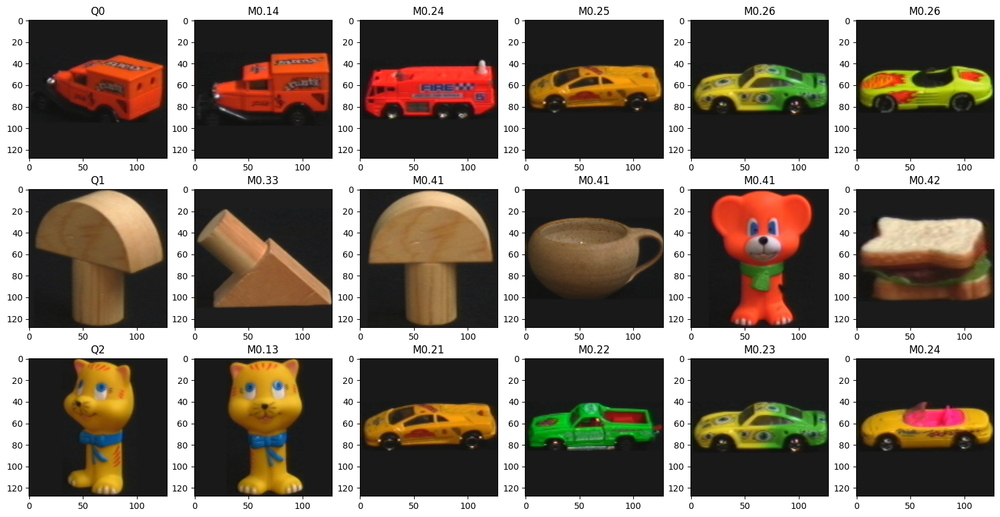

In [73]:
#Here we add the values of the best accuracy for the gb histogram type we found in the previous exercise
hist_type = "gb"
dist_type = "intersect"
num_bins = 32

## visualize nearest neighbors
query_images_vis = [query_images[i] for i in np.array([0, 4, 9])]
show_neighbors(model_images, query_images_vis, dist_type, hist_type, num_bins)


### **Question 4.2: Performance Evaluation** *(2/5 Points)*

Write the code to compute the metrics for performance evaluation, then run the provided code cell to check if your results are correct.

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

In [74]:
data = pd.read_csv("./assets/ionosphere.data", header=None)
X = data[data.columns[:34]]
y = data[data.columns[-1]]
y = np.array([0 if value == "b" else 1 for value in y])
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
clf = LogisticRegression(random_state=0)
clf.fit(X_train, y_train)
y_pred = clf.predict_proba(X_test)[:, 1]


In [75]:
def my_accuracy_score(y_true: list, y_pred: list) -> float:
    """
    Compute the accuracy score.

    Args:
        y_true (list): list of true labels.
        y_pred (list): list of predicted labels.

    Returns:
        float: accuracy score.
    """
    #Here we calculate the accuracy score. This is the ratio of correct predictions to total predictions.
    accuracy = np.sum(y_true == y_pred) / len(y_true)

    #Here we return the accuracy score
    return accuracy


def my_precision_score(y_true: list, y_pred: list) -> float:
    """
    Compute the precision score.

    Args:
        y_true (list): list of true labels.
        y_pred (list): list of predicted labels.

    Returns:
        float: precision score.
    """  
    #Here we calculate the true positives and false positives
    tp = np.sum((y_true == 1) & (y_pred == 1))
    fp = np.sum((y_true == 0) & (y_pred == 1))

    #Here we calculate the precision score. This is the ratio tp / (tp + fp) where tp is the number of true positives and fp the number of false positives.
    precision = tp / (tp + fp)
    
    #Here we return the precision score
    return precision


def my_recall_score(y_true: list, y_pred: list) -> float:
    """
    Compute the recall score.

    Args:
        y_true (list): list of true labels.
        y_pred (list): list of predicted labels.

    Returns:
        float: recall score.
    """  
    #Here we calculate the true positives and false negatives
    tp = np.sum((y_true == 1) & (y_pred == 1))
    fn = np.sum((y_true == 1) & (y_pred == 0))

    #Here we calculate the recall score. This is the ratio tp / (tp + fn) where tp is the number of true positives and fn the number of false negatives.
    recall = tp / (tp + fn)
    return recall


def my_f1_score(y_true: list, y_pred: list) -> float:
    """
    Compute the f1 score.

    Args:
        y_true (list): list of true labels.
        y_pred (list): list of predicted labels.

    Returns:
        float: f1 score.
    """  
    
    #Here we calculate the precision and recall scores
    precision = my_precision_score(y_true, y_pred)
    recall = my_recall_score(y_true, y_pred)

    #Here we calculate the f1 score. This is the harmonic mean of precision and recall.
    f1 = 2 * precision * recall / (precision + recall)

    #Here we return the f1 score
    return f1


def my_confusion_matrix(y_true: list, y_pred: list) -> np.ndarray:
    """
    Compute the confusion matrix.

    Args:
        y_true (list): list of true labels.
        y_pred (list): list of predicted labels.

    Returns:
        np.ndarray: confusion matrix.
    """  
    
    #Here we calculate the true positives, true negatives, false positives and false negatives
    tp = np.sum((y_true == 1) & (y_pred == 1))
    tn = np.sum((y_true == 0) & (y_pred == 0))
    fp = np.sum((y_true == 0) & (y_pred == 1))
    fn = np.sum((y_true == 1) & (y_pred == 0))

    #Here we construct the confusion matrix.
    matrix = [[tn, fp], [fn, tp]]

    #Here we return the confusion matrix
    return np.array(matrix, dtype=np.int64)


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

In [76]:
# CHECK IF YOUR METRICS ARE CORRECT BY RUNNING THIS CODE CELL


def compare_metric(my_metric_fun, metric_fun, y_test, preds):
    try:
        if my_metric_fun.__name__ != "my_confusion_matrix":
            assert round(my_metric_fun(y_test, preds), 4) == round(
                metric_fun(y_test, preds), 4
            )
        else:
            assert np.array_equal(
                my_metric_fun(y_test, preds), metric_fun(y_test, preds)
            )
        print(f"{my_metric_fun.__name__} is correct")
    except:
        print(f"{my_metric_fun.__name__} is wrong")


preds = np.array([0 if p < 0.5 else 1 for p in y_pred])
compare_metric(my_accuracy_score, accuracy_score, y_test, preds)
compare_metric(my_precision_score, precision_score, y_test, preds)
compare_metric(my_recall_score, recall_score, y_test, preds)
compare_metric(my_f1_score, f1_score, y_test, preds)
compare_metric(my_confusion_matrix, confusion_matrix, y_test, preds)


my_accuracy_score is correct
my_precision_score is correct
my_recall_score is correct
my_f1_score is correct
my_confusion_matrix is correct


### **Question 4.3: Analysis and Report** *(1/5 Points)*

Write the code to compute the metrics all the possible tresholds in the interval (0.0, 1.0) with increments of 0.5.  
Ideally, you should put everything into a pandas DataFrame and print it for a better visualization.  
Then, write a report analyzing you your results. You have complete freedom on your analysis.

Imagine also to be in a medical scenario where your model is predicting the presence or not of a desease and try to answer to the following questions:
- What is the real life trade-off between high precision and high recall? What would you choose?
- Why isn't the accuracy an appropriate measure in such scenario?

#### **Analysis and Report**
--------------------------------------------

Here we wrote the code to compute the metrics for all the possible threshold values in the interval (0.0,1.0) with increments of **0.05** (since 0.5 is not a very visual increment). At the end we print our results in a Pandas Dataframe:


In [77]:
#Write the code to compute the metrics all the possible tresholds in the interval (0.0, 1.0) with increments of 0.5.  
#Ideally, you should put everything into a pandas DataFrame and print it for a better visualization.  

def metrics_calculator(y_pred: np.ndarray, y_test: np.ndarray, threshold_inferior_limit: int, threshold_superior_limit: int, steps: float = 0.5):
    """
    Function that computes the metrics for different thresholds.

    Args:
        threshold_inferior_limit (int): inferior limit of the threshold.
        threshold_superior_limit (int): upper limit of the threshold.
        steps (float): steps for the threshold.

    Returns:
        metrics (pandas.DataFrame): dataframe containing the metrics for each threshold.
    """

    #Here we build a range of thresholds
    thresholds = np.arange(threshold_inferior_limit, threshold_superior_limit, steps)
    
    #Here we initialize the lists that will contain the metrics for each threshold
    accuracy_list = []
    precision_list = []
    recall_list = []
    f1_list = []
    confusion_matrix_list = []

    #Here we loop over the thresholds
    for threshold in thresholds:
        #For each threshold, we define the predictions that are 0 or 1 depending on the threshold
        preds = np.array([0 if p < threshold else 1 for p in y_pred])

        #Here we compute the metrics for the given threshold and append them to the lists
        accuracy_list.append(my_accuracy_score(y_test, preds))
        precision_list.append(my_precision_score(y_test, preds))
        recall_list.append(my_recall_score(y_test, preds))
        f1_list.append(my_f1_score(y_test, preds))
        confusion_matrix_list.append(my_confusion_matrix(y_test, preds))

    #Here we build the dataframe containing the metrics for each threshold
    metrics = pd.DataFrame({'threshold': thresholds, 'accuracy': accuracy_list, 'precision': precision_list, 'recall': recall_list, 'f1': f1_list, 'confusion_matrix': confusion_matrix_list})
    
    #Here we return the dataframe
    return metrics

#Here we print the metrics for the given thresholds
print(metrics_calculator(y_pred, y_test, 0.0, 1.0, 0.05))


    threshold  accuracy  precision  recall        f1     confusion_matrix
0        0.00  0.568182   0.568182    1.00  0.724638   [[0, 38], [0, 50]]
1        0.05  0.727273   0.675676    1.00  0.806452  [[14, 24], [0, 50]]
2        0.10  0.772727   0.714286    1.00  0.833333  [[18, 20], [0, 50]]
3        0.15  0.784091   0.724638    1.00  0.840336  [[19, 19], [0, 50]]
4        0.20  0.806818   0.746269    1.00  0.854701  [[21, 17], [0, 50]]
5        0.25  0.829545   0.769231    1.00  0.869565  [[23, 15], [0, 50]]
6        0.30  0.863636   0.806452    1.00  0.892857  [[26, 12], [0, 50]]
7        0.35  0.875000   0.819672    1.00  0.900901  [[27, 11], [0, 50]]
8        0.40  0.897727   0.847458    1.00  0.917431   [[29, 9], [0, 50]]
9        0.45  0.909091   0.862069    1.00  0.925926   [[30, 8], [0, 50]]
10       0.50  0.909091   0.862069    1.00  0.925926   [[30, 8], [0, 50]]
11       0.55  0.909091   0.862069    1.00  0.925926   [[30, 8], [0, 50]]
12       0.60  0.897727   0.859649    

From this data we can make the following observations:

- As the threshold increases, the accuracy generally improves because the model becomes more conservative in making positive predictions. However, this improvement in accuracy comes at the cost of reducing recall.

- Precision steadily increases as the threshold rises. This means that the model's positive predictions are more accurate and have fewer false positives (we can see this with the confusion matrix).

- Recall remains high until a threshold of 0.60, after which it starts to decline. This means that the model becomes less effective in identifying all positive cases as the threshold increases (we can see this with the confusion matrix).

- The F1 score, which balances precision and recall, also reaches its peak at a threshold of 0.60 and 0.65. This represents a good trade-off between precision and recall for the given problem.

We can make a plot of the confusion matrix as the threshold gets bigger to visualize this in a better way:


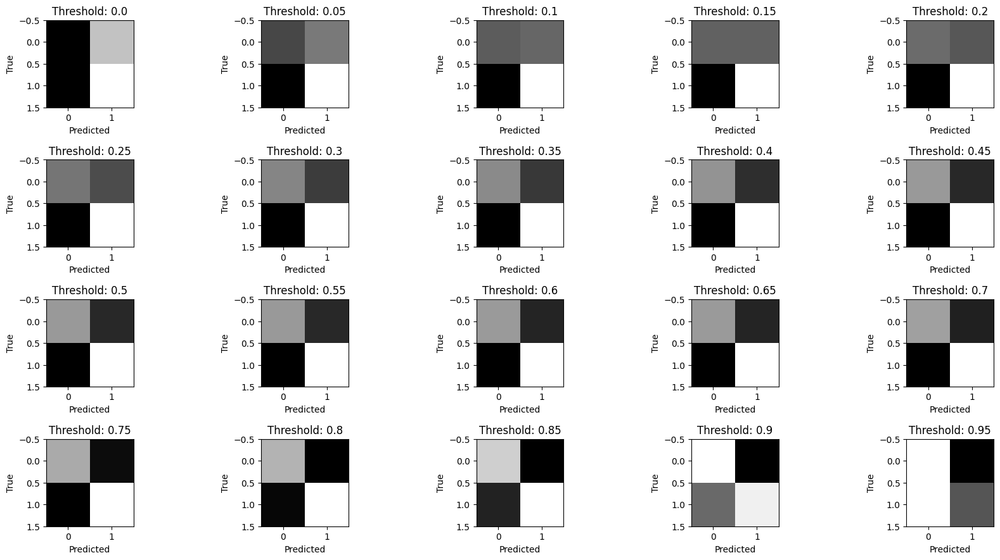

In [99]:
#Here we plot the confusion matrix for each threshold value. We need to show all the 4 the values of the confusion matrix in the plot.
plt.figure(figsize=(20, 10))

#Here we loop over the thresholds
for i, threshold in enumerate(np.arange(0.0, 1.0, 0.05)):
    #For each threshold, we define the predictions that are 0 or 1 depending on the threshold
    preds = np.array([0 if p < threshold else 1 for p in y_pred])

    #Here we compute the confusion matrix for the given threshold
    matrix = my_confusion_matrix(y_test, preds)

    #Here we plot the confusion matrix
    plt.subplot(4, 5, i+1)
    plt.imshow(matrix)
    plt.title(f"Threshold: {round(threshold,2)}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.6)


From this plot we can make the following observations:

- The number of true positives decreases and the number of false negatives increases (both mainly for a very high threshold).
- The number of true negatives increases and the number of false positives decreases.

The reasons why the confusion matrix changes as the threshold for selecting a prediction as true or false increases can be explained more specifically in terms of the confusion matrix elements:

- As the threshold increases, the model becomes more conservative in its predictions. This means that we're less likely to classify a prediction as true positive, even if it actually is. This results in a decrease in the number of true positives. On the other side, we're more likely to classify a prediction as false negative. This results in an increase in the number of false negatives.

- As the threshold increases, we're more likely to classify a prediction as true negative, even if it is actually false positive. On the other side, we're less likely to classify a prediction as false positive. This results in a decrease in the number of false positives.


In other words, as the threshold increases, the we shift our predictions towards true negatives and false negatives, and away from true positives and false positives. This is because we're less likely to classify a prediction as true positive or false positive if its predicted probability is close to the threshold.



In a medical diagnosis scenario, the real life trade-off between high precision and high recall is between:

* Avoiding **false positives**: False positives are patients who are incorrectly diagnosed with a disease.
* Avoiding **false negatives**: False negatives are patients who are incorrectly diagnosed as not having a disease.


In general, we believe that is more important to avoid false negatives in medical diagnosis since it is worse to not diagnose a disease. For example, if a COVID test is a false negative, the patient may not receive the necessary treatment until it can be too late.


**Which would we choose?**

If we had to choose between high precision and high recall in a medical diagnosis scenario, we would choose high recall. This is because we would rather have a model that identifies all of the patients with a disease, even if it means that some patients are incorrectly diagnosed. 

**Why isn't accuracy an appropriate measure in such scenario?**

Accuracy is a measure of how often a model is correct overall. However, accuracy is not a good measure of performance in a medical diagnosis scenario where the prevalence of the disease is low. This is because a model can achieve high accuracy simply by predicting that all patients are negative for the disease. A better measure of performance in a medical diagnosis scenario would be the F1 score. The F1 score is a harmonic mean of precision and recall, which means that it balances both metrics equally.